In [67]:
import pandas as pd 
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [68]:
# Reading data from Excel
data = pd.read_excel(r"C:\Users\Geetha\Desktop\Casestudy\merged_data1.xlsx")

In [69]:
# Printing number of rows and columns (total original columns- 27, dropped FName, LName, Annual Income and country code
# while combining data hence we have 23 columns)
print("Number of rows:", data.shape[0], "\nNumber of columns:", data.shape[1])

Number of rows: 29970 
Number of columns: 23


In [70]:
# Display the top 5 rows of the data
data.head()

,Account_Number,Month,Product,FICO_Score_Original,FICO_Score_Current,Origination_Date,Maturity_Date,Commitments,Outstandings,LTV_Original,...,Interest_Variability_Code,Collateral_Value,Payment_Amount,Origination_DTI,APR,Borrower.Zip_Code,Borrower.Total_Mortgage_Balances,Borrower.Total_HE_Balances,Borrower.Num_Trades_Past_Due,Borrower.Num_HE_Trades
0,5000,2017-03-31,HELOAN,677,0,2012-07-24,2022-08-21,0.0,0.0,0.816,...,FXD,0,0,0.327,0.0171,44130.0,0,0,NaN,NaN
1,5000,2017-04-30,HELOAN,677,0,2012-07-24,2022-08-21,0.0,0.0,0.816,...,FXD,0,0,0.327,0.0176,44130.0,0,0,NaN,NaN
2,5000,2017-05-31,HELOAN,677,0,2012-07-24,2022-08-21,0.0,0.0,0.816,...,FXD,0,0,0.327,0.0181,44130.0,0,0,NaN,NaN
3,5000,2017-06-30,HELOAN,677,0,2012-07-24,2022-08-21,0.0,0.0,0.816,...,FXD,0,0,0.327,0.0178,44130.0,0,0,NaN,NaN
4,5000,2017-07-31,HELOAN,677,0,2012-07-24,2022-08-21,0.0,0.0,0.816,...,FXD,0,0,0.327,0.0167,44130.0,0,0,NaN,NaN


In [71]:
# Descriptive statistics of the data
data.describe()

,Account_Number,FICO_Score_Original,FICO_Score_Current,Commitments,Outstandings,LTV_Original,LTV_Current,Day_Past_Due,Collateral_Value,Payment_Amount,Origination_DTI,APR,Borrower.Zip_Code,Borrower.Total_Mortgage_Balances,Borrower.Total_HE_Balances,Borrower.Num_Trades_Past_Due,Borrower.Num_HE_Trades
count,29970.000000,29970.000000,29970.000000,2.997000e+04,2.997000e+04,29970.000000,29970.000000,29970.000000,29970.0,29970.0,29970.000000,29970.000000,1.838100e+04,2.997000e+04,2.997000e+04,14244.000000,14316.000000
mean,2501.285786,480.341375,570.998165,3.392026e+04,3.385923e+04,0.435071,0.261772,48.708108,0.0,0.0,0.245344,0.037120,6.920616e+06,1.592274e+04,3.057457e+04,79.278854,1.827326
std,1443.622555,358.364259,308.637459,4.281034e+04,4.294814e+04,0.309603,0.322907,347.690019,0.0,0.0,0.630409,0.033895,3.168855e+07,6.946596e+04,6.110413e+04,32.468215,0.997277
min,1.000000,0.000000,0.000000,0.000000e+00,-7.169974e+04,0.000000,-0.267000,0.000000,0.0,0.0,0.000000,0.000000,4.096000e+03,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,1251.000000,0.000000,553.000000,8.363140e+03,8.354688e+03,0.148000,0.016000,0.000000,0.0,0.0,0.000000,0.000000,4.410200e+04,0.000000e+00,0.000000e+00,93.000000,1.000000
50%,2502.000000,693.000000,705.000000,2.134054e+04,2.133609e+04,0.417000,0.149000,0.000000,0.0,0.0,0.221000,0.041000,4.431100e+04,0.000000e+00,0.000000e+00,93.000000,2.000000
75%,3752.000000,765.000000,780.000000,4.503648e+04,4.491540e+04,0.730000,0.411000,0.000000,0.0,0.0,0.368000,0.064300,4.606900e+04,0.000000e+00,4.215400e+04,93.000000,2.000000
max,5000.000000,893.000000,1049.000000,1.161719e+06,1.168036e+06,1.315000,6.530000,8556.000000,0.0,0.0,10.499000,0.129400,4.271879e+08,1.748134e+06,1.510888e+06,93.000000,9.000000


In [72]:
# General info about data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29970 entries, 0 to 29969
Data columns (total 23 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Account_Number                    29970 non-null  int64         
 1   Month                             29970 non-null  datetime64[ns]
 2   Product                           29970 non-null  object        
 3   FICO_Score_Original               29970 non-null  int64         
 4   FICO_Score_Current                29970 non-null  int64         
 5   Origination_Date                  29970 non-null  datetime64[ns]
 6   Maturity_Date                     29970 non-null  datetime64[ns]
 7   Commitments                       29970 non-null  float64       
 8   Outstandings                      29970 non-null  float64       
 9   LTV_Original                      29970 non-null  float64       
 10  LTV_Current                       29970 non-nu

In [73]:
# calculating the total and percentage to decide how to proceed with missing values
total = data.isnull().sum().sort_values(ascending = False)
percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
pd.concat([total, percent], axis=1, keys=['Total', 'Percent']).transpose()

,Borrower.Num_Trades_Past_Due,Borrower.Num_HE_Trades,Borrower.Zip_Code,Interest_Variability_Code,Day_Past_Due,Borrower.Total_HE_Balances,Borrower.Total_Mortgage_Balances,APR,Origination_DTI,Payment_Amount,...,LTV_Current,LTV_Original,Outstandings,Commitments,Maturity_Date,Origination_Date,FICO_Score_Current,FICO_Score_Original,Product,Lien_Position
Total,15726.000000,15654.000000,11589.000000,10998.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Percent,52.472472,52.232232,38.668669,36.696697,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [74]:
# Since more than half percentage of values are missing for Num of trades past due and Number of HE trades, 
# there is no use of imputing the values as well hence removing these two columns

In [75]:
# droping two columns
data_drop1 = data.drop(['Borrower.Num_Trades_Past_Due', 'Borrower.Num_HE_Trades'], axis=1)

In [76]:
# frequently repeated zipcode
data_drop1.mode()['Borrower.Zip_Code'][0]

44120.0

In [77]:
# replace 38% missing values with mode
data_drop1['Borrower.Zip_Code']=data_drop1['Borrower.Zip_Code'].fillna(data_drop1.mode()['Borrower.Zip_Code'][0])

In [78]:
# We still need to fill the missing values for Interest variablity code. Lets explore the data further and decide

In [79]:
# Another way to check number of null values in the data
data_drop1.isnull().sum()

Account_Number                          0
Month                                   0
Product                                 0
FICO_Score_Original                     0
FICO_Score_Current                      0
Origination_Date                        0
Maturity_Date                           0
Commitments                             0
Outstandings                            0
LTV_Original                            0
LTV_Current                             0
Lien_Position                           0
Day_Past_Due                            0
Interest_Variability_Code           10998
Collateral_Value                        0
Payment_Amount                          0
Origination_DTI                         0
APR                                     0
Borrower.Zip_Code                       0
Borrower.Total_Mortgage_Balances        0
Borrower.Total_HE_Balances              0
dtype: int64

In [80]:
# zero count does not mean we dont have missing values. It is very common to have unexpected null values i.e., 
# nulls represented by zero or some character or word.

In [81]:
# removing static data columns as they do not help us in any way
data_drop2=data_drop1.drop(['Product', 'Collateral_Value', 'Payment_Amount'], axis=1)

In [82]:
# removing rows where most of the feature values are zero
index_names = data_drop2[(data_drop2['FICO_Score_Original']==0) & (data_drop2['FICO_Score_Current']==0) & (data_drop2['Commitments']==0) & (data_drop2['Outstandings']==0) 
& (data_drop2['LTV_Original']==0) & (data_drop2['LTV_Current']==0) & (data_drop2['Day_Past_Due']==0) & (data_drop2['Origination_DTI']==0) &
(data_drop2['Borrower.Total_Mortgage_Balances']==0) & (data_drop2['Borrower.Total_HE_Balances']==0)].index                                                                    

In [83]:
data_drop2.drop(index_names, inplace =True)

In [84]:
data_drop2.shape

(29934, 18)

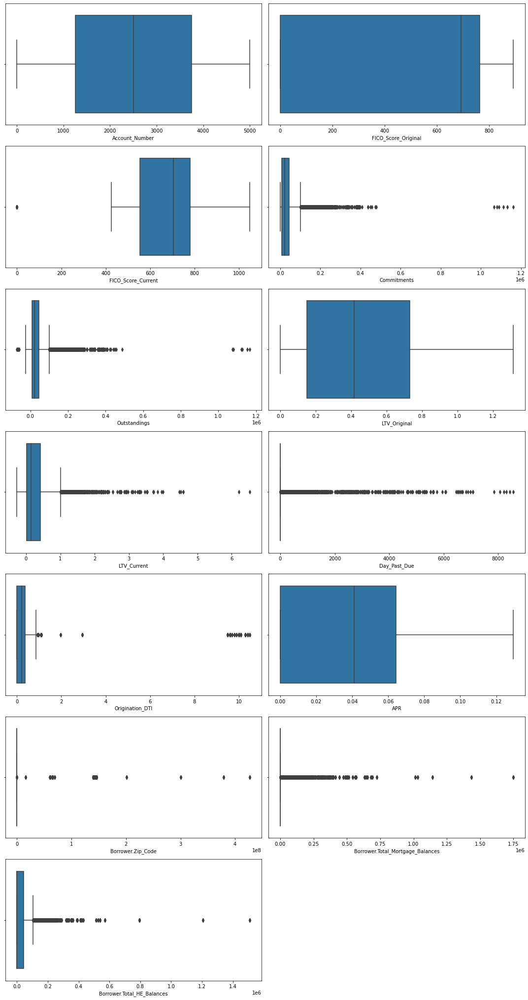

In [85]:
# lets look at outliers
plt.figure(figsize=(15,60))
n=1
for column in data_drop2.select_dtypes(('int64', 'float64')):
    plt.subplot(15,2,n)
    sns.boxplot(x=data_drop2[column])
    plt.tight_layout()
    n=n+1
plt.show()

In [86]:
columns=['FICO_Score_Original','FICO_Score_Current', 'Commitments', 'LTV_Original', 'APR', 'Outstandings', 'LTV_Current', 'Day_Past_Due','Origination_DTI','Borrower.Total_Mortgage_Balances','Borrower.Total_HE_Balances']
dict_outliers = dict()
for column in data_drop2[columns]:
    q1 = data_drop2[column].quantile(0.25)
    q3 = data_drop2[column].quantile(0.75)
    iqr = q3 - q1
    iqr_3 = 3*iqr
    lower_limit = q1 - iqr_3
    upper_limit = q3 + iqr_3
    dict_outliers[column] = len(data_drop2[(data_drop2[column]<lower_limit) | (data_drop2[column]>upper_limit)][column])

In [87]:
dict_outliers

{'FICO_Score_Original': 0,
 'FICO_Score_Current': 0,
 'Commitments': 561,
 'LTV_Original': 0,
 'APR': 0,
 'Outstandings': 577,
 'LTV_Current': 158,
 'Day_Past_Due': 3036,
 'Origination_DTI': 126,
 'Borrower.Total_Mortgage_Balances': 3582,
 'Borrower.Total_HE_Balances': 852}

In [88]:
# check 95 percentile
columns=['FICO_Score_Original','FICO_Score_Current', 'Commitments', 'LTV_Original', 'APR', 'Outstandings', 'LTV_Current', 'Day_Past_Due','Origination_DTI','Borrower.Total_Mortgage_Balances','Borrower.Total_HE_Balances']
for column in columns:
    print(column+': \n'+'5th percentile', data_drop2[column].quantile(0.05), '; 95th percentile', data_drop2[column].quantile(0.95))

FICO_Score_Original: 
5th percentile 0.0 ; 95th percentile 831.0
FICO_Score_Current: 
5th percentile 0.0 ; 95th percentile 840.0
Commitments: 
5th percentile 0.0 ; 95th percentile 109344.94099999996
LTV_Original: 
5th percentile 0.0 ; 95th percentile 0.876
APR: 
5th percentile 0.0 ; 95th percentile 0.0928
Outstandings: 
5th percentile 0.0 ; 95th percentile 109031.21449999989
LTV_Current: 
5th percentile 0.0 ; 95th percentile 0.832
Day_Past_Due: 
5th percentile 0.0 ; 95th percentile 69.0
Origination_DTI: 
5th percentile 0.0 ; 95th percentile 0.51
Borrower.Total_Mortgage_Balances: 
5th percentile 0.0 ; 95th percentile 106369.0
Borrower.Total_HE_Balances: 
5th percentile 0.0 ; 95th percentile 133363.0


In [89]:
data_drop2.describe()

,Account_Number,FICO_Score_Original,FICO_Score_Current,Commitments,Outstandings,LTV_Original,LTV_Current,Day_Past_Due,Origination_DTI,APR,Borrower.Zip_Code,Borrower.Total_Mortgage_Balances,Borrower.Total_HE_Balances
count,29934.000000,29934.000000,29934.000000,2.993400e+04,2.993400e+04,29934.000000,29934.000000,29934.000000,29934.000000,29934.000000,2.993400e+04,2.993400e+04,2.993400e+04
mean,2502.318233,480.919055,571.684873,3.396106e+04,3.389995e+04,0.435594,0.262087,48.766687,0.245639,0.037095,4.266639e+06,1.594189e+04,3.061134e+04
std,1444.065669,358.192086,308.186715,4.281990e+04,4.295789e+04,0.309421,0.322973,347.894931,0.630731,0.033877,2.505597e+07,6.950552e+04,6.113166e+04
min,1.000000,0.000000,0.000000,0.000000e+00,-7.169974e+04,0.000000,-0.267000,0.000000,0.000000,0.000000,4.096000e+03,0.000000e+00,0.000000e+00
25%,1251.000000,0.000000,554.000000,8.412412e+03,8.392140e+03,0.149000,0.017000,0.000000,0.000000,0.000000,4.412000e+04,0.000000e+00,0.000000e+00
50%,2505.000000,693.000000,705.500000,2.137800e+04,2.138479e+04,0.418000,0.149000,0.000000,0.221000,0.041000,4.412000e+04,0.000000e+00,0.000000e+00
75%,3753.000000,765.000000,780.000000,4.506382e+04,4.494567e+04,0.730000,0.412000,0.000000,0.368000,0.064200,4.483000e+04,0.000000e+00,4.223500e+04
max,5000.000000,893.000000,1049.000000,1.161719e+06,1.168036e+06,1.315000,6.530000,8556.000000,10.499000,0.129400,4.271879e+08,1.748134e+06,1.510888e+06


In [90]:
#FICO_Score_Original: max value 893 higher than 831
#FICO_Score_Current: max value 1049 higher than 840
#Commitments: max value 1161719 much higher than 109344
#Outstandings: max value is 1168036 much higher than 95th percentile 109031
#LTV_Original: max value 1.315 higher than 0.876
#LTV_Current: max value 6.5 is much higher than 0.832, min value -0.267000 much less than 5th percentile 0
#Day_Past_Due: max value 8556 much higher than 69
#Origination_DTI: max value 10.499 much higher than 0.51
#APR: max value 0.129400 higher than 0.0928
#Borrower.Total_Mortgage_Balances: max value 1748134 much higher than 106369.0
#Borrower.Total_HE_Balances: max value 1510888 much higher than 133363.0

In [91]:
# considered data points after 95th percentile as outliers and replaced values with 95th percentile
data_drop2.loc[data_drop2['FICO_Score_Original']>831, 'FICO_Score_Original']=831
data_drop2.loc[data_drop2['FICO_Score_Current']>840, 'FICO_Score_Current']=840
data_drop2.loc[data_drop2['Commitments']>109344, 'Commitments']=109344
data_drop2.loc[data_drop2['Outstandings']>109031, 'Outstandings']=109031
data_drop2.loc[data_drop2['LTV_Original']>0.876, 'LTV_Original']=0.876
data_drop2.loc[data_drop2['LTV_Current']>0.832, 'LTV_Current']=0.832
data_drop2.loc[data_drop2['LTV_Current']<=-0.267000, 'LTV_Current']=0
data_drop2.loc[data_drop2['Day_Past_Due']>69, 'Day_Past_Due']=69
data_drop2.loc[data_drop2['Origination_DTI']>0.51, 'Origination_DTI']=0.51
data_drop2.loc[data_drop2['APR']>0.0928, 'APR']=0.0928
data_drop2.loc[data_drop2['Borrower.Total_Mortgage_Balances']>106369, 'Borrower.Total_Mortgage_Balances']=106369
data_drop2.loc[data_drop2['Borrower.Total_HE_Balances']>133363, 'Borrower.Total_HE_Balances']=133363

In [92]:
# it does not make sense to have 0 value for the below columns hence replacing with null value
columns=['FICO_Score_Original','FICO_Score_Current', 'Commitments', 'LTV_Original', 'Origination_DTI', 'APR', 'Borrower.Total_Mortgage_Balances', 'Borrower.Total_HE_Balances']
for col in columns:
    data_drop2[col].replace([0], [None], inplace=True)

In [93]:
data_drop2.isnull().sum()

Account_Number                          0
Month                                   0
FICO_Score_Original                 10531
FICO_Score_Current                   6391
Origination_Date                        0
Maturity_Date                           0
Commitments                          3605
Outstandings                            0
LTV_Original                         3983
LTV_Current                             0
Lien_Position                           0
Day_Past_Due                            0
Interest_Variability_Code           10991
Origination_DTI                     11401
APR                                 11358
Borrower.Zip_Code                       0
Borrower.Total_Mortgage_Balances    26352
Borrower.Total_HE_Balances          15630
dtype: int64

In [94]:
# To check the total number of null values and percent to decide whether we can eliminate records with missing 
#values or need to impute with mean, median
total = data_drop2.isnull().sum().sort_values(ascending = False)
percent = (data_drop2.isnull().sum()/data_drop2.isnull().count()*100).sort_values(ascending = False)
pd.concat([total, percent], axis=1, keys=['total', 'percent']).transpose()

,Borrower.Total_Mortgage_Balances,Borrower.Total_HE_Balances,Origination_DTI,APR,Interest_Variability_Code,FICO_Score_Original,FICO_Score_Current,LTV_Original,Commitments,Day_Past_Due,Borrower.Zip_Code,Account_Number,Lien_Position,Month,Outstandings,Maturity_Date,Origination_Date,LTV_Current
total,26352.000000,15630.000000,11401.000000,11358.000000,10991.000000,10531.000000,6391.000000,3983.00000,3605.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
percent,88.033674,52.214873,38.087125,37.943476,36.717445,35.180731,21.350304,13.30594,12.043162,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [95]:
# dropping Borrower.Total_Mortgage_Balances, Borrower.Total_HE_Balances as majority points are missing and no use of imputing as well
# droping two columns
data_dp = data_drop2.drop(['Borrower.Total_Mortgage_Balances', 'Borrower.Total_HE_Balances'], axis=1)

In [96]:
# removing missing rows data
data_drop3=data_dp.dropna()

In [97]:
num_rows_lost = round(100*(data_drop2.shape[0] - data_drop3.shape[0])/float(data_drop2.shape[0]))
num_rows_lost

51

In [98]:
# By removing the missing rows we lost almost 51% of data. The model isn't really learning as much as possible 
# as we are ignoring over half of data observation.

In [99]:
data_dp.isnull().sum()

Account_Number                   0
Month                            0
FICO_Score_Original          10531
FICO_Score_Current            6391
Origination_Date                 0
Maturity_Date                    0
Commitments                   3605
Outstandings                     0
LTV_Original                  3983
LTV_Current                      0
Lien_Position                    0
Day_Past_Due                     0
Interest_Variability_Code    10991
Origination_DTI              11401
APR                          11358
Borrower.Zip_Code                0
dtype: int64

In [100]:
#imputing missing values for continuous variables
columns=['FICO_Score_Original','FICO_Score_Current', 'Commitments', 'LTV_Original', 'Origination_DTI', 'APR']
for num in data_dp[columns]:
    if data_dp[num].isnull().sum()!=0:
        data_dp[num]=data_dp[num].fillna(data_dp[num].mean())

In [101]:
data_dp.isnull().sum()

Account_Number                   0
Month                            0
FICO_Score_Original              0
FICO_Score_Current               0
Origination_Date                 0
Maturity_Date                    0
Commitments                      0
Outstandings                     0
LTV_Original                     0
LTV_Current                      0
Lien_Position                    0
Day_Past_Due                     0
Interest_Variability_Code    10991
Origination_DTI                  0
APR                              0
Borrower.Zip_Code                0
dtype: int64

In [102]:
data_dp.mode()['Interest_Variability_Code'][0]

'FXD'

In [103]:
# replace 36% missing values with mode
data_dp['Interest_Variability_Code']=data_dp['Interest_Variability_Code'].fillna(data_dp.mode()['Interest_Variability_Code'][0])

In [104]:
data_dp.isnull().sum()

Account_Number               0
Month                        0
FICO_Score_Original          0
FICO_Score_Current           0
Origination_Date             0
Maturity_Date                0
Commitments                  0
Outstandings                 0
LTV_Original                 0
LTV_Current                  0
Lien_Position                0
Day_Past_Due                 0
Interest_Variability_Code    0
Origination_DTI              0
APR                          0
Borrower.Zip_Code            0
dtype: int64

In [105]:
# Data cleaning completed for further analysis.

In [106]:
# convert categorical to numerical values using one hot encoding
dummies=pd.get_dummies(data_dp, columns=['Interest_Variability_Code', 'Lien_Position'])

In [107]:
data_drop2_final=dummies.drop(['Interest_Variability_Code_ADJ', 'Lien_Position_OT_LIEN'], axis=1)

In [108]:
data_drop2_final.head()

,Account_Number,Month,FICO_Score_Original,FICO_Score_Current,Origination_Date,Maturity_Date,Commitments,Outstandings,LTV_Original,LTV_Current,Day_Past_Due,Origination_DTI,APR,Borrower.Zip_Code,Interest_Variability_Code_FXD,Interest_Variability_Code_VAR,Lien_Position_JR_LIEN,Lien_Position_SR_LIEN
0,5000,2017-03-31,677.0,724.983435,2012-07-24,2022-08-21,35526.09517,0.0,0.816,0.137,0,0.327,0.0171,44130.0,1,0,1,0
1,5000,2017-04-30,677.0,724.983435,2012-07-24,2022-08-21,35526.09517,0.0,0.816,0.137,0,0.327,0.0176,44130.0,1,0,1,0
2,5000,2017-05-31,677.0,724.983435,2012-07-24,2022-08-21,35526.09517,0.0,0.816,0.136,0,0.327,0.0181,44130.0,1,0,1,0
3,5000,2017-06-30,677.0,724.983435,2012-07-24,2022-08-21,35526.09517,0.0,0.816,0.141,0,0.327,0.0178,44130.0,1,0,1,0
4,5000,2017-07-31,677.0,724.983435,2012-07-24,2022-08-21,35526.09517,0.0,0.816,0.140,0,0.327,0.0167,44130.0,1,0,1,0


In [109]:
# Goal is to create two dataframes one with mar to july data and another with aug data
filtered_data_drop2=data_drop2_final.loc[(data_drop2_final['Month'] >= '3/01/2017') & (data_drop2_final['Month'] < '8/01/2017')]

In [110]:
# Aug Data
filtered_Aug_data_drop2 = data_drop2.loc[(data_drop2['Month'] >= '8/01/2017') & (data_drop2['Month'] < '9/01/2017')]

In [111]:
# dropping all columns from aug data except account number and days past due
filtered_Aug_data_drop2_1 = filtered_Aug_data_drop2.drop(filtered_Aug_data_drop2.columns.difference(['Account_Number','Day_Past_Due']), 1, inplace=True)

C:\Users\Geetha\AppData\Local\Temp/ipykernel_18860/2628812994.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  filtered_Aug_data_drop2_1 = filtered_Aug_data_drop2.drop(filtered_Aug_data_drop2.columns.difference(['Account_Number','Day_Past_Due']), 1, inplace=True)
C:\Users\Geetha\Anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [112]:
# Adding new column cust status and filling values based on days past due values. If days_past_due=0 then cust_status =0 else 1
filtered_Aug_data_drop2['cust_status'] = np.where(filtered_Aug_data_drop2['Day_Past_Due'] == 0, 0, 1)

C:\Users\Geetha\AppData\Local\Temp/ipykernel_18860/1396103598.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_Aug_data_drop2['cust_status'] = np.where(filtered_Aug_data_drop2['Day_Past_Due'] == 0, 0, 1)


In [113]:
# top 5 rows of aug data after adding cust_status column
filtered_Aug_data_drop2.head()

,Account_Number,Day_Past_Due,cust_status
5,5000,0,0
11,4999,0,0
17,4998,0,0
23,4997,0,0
29,4996,0,0


In [114]:
filtered_Aug_data_drop2_removeday=filtered_Aug_data_drop2.drop(['Day_Past_Due'], axis=1)

In [115]:
filtered_Aug_data_drop2_removeday.head()

,Account_Number,cust_status
5,5000,0
11,4999,0
17,4998,0
23,4997,0
29,4996,0


In [116]:
# Grouping 5 months data from March to july by account number
filtered_data_drop2_group = filtered_data_drop2.groupby('Account_Number')

In [117]:
# displaying the groups by account number
for Account_Number, Account_Number_df in filtered_data_drop2_group:
    print(Account_Number)
    print(Account_Number_df)

1
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
29964               1 2017-03-31           740.412977          724.983435   
29965               1 2017-04-30           740.412977          724.983435   
29966               1 2017-05-31           740.412977          724.983435   
29967               1 2017-06-30           740.412977          724.983435   
29968               1 2017-07-31           740.412977          724.983435   

      Origination_Date Maturity_Date   Commitments  Outstandings  \
29964       1996-11-18    2016-07-01  101216.26000     102198.94   
29965       1996-11-18    2016-07-01  101216.26000     101216.26   
29966       1996-11-18    2016-07-01   96302.85000     100233.57   
29967       1996-11-18    2016-07-01   35526.09517          0.00   
29968       1996-11-18    2016-07-01   35526.09517          0.00   

       LTV_Original  LTV_Current  Day_Past_Due  Origination_DTI       APR  \
29964      0.499809          0.0            69   

29710                      1  
45
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
29700              45 2017-03-31           740.412977               792.0   
29701              45 2017-04-30           740.412977               797.0   
29702              45 2017-05-31           740.412977               765.0   
29703              45 2017-06-30           740.412977               773.0   
29704              45 2017-07-31           740.412977               836.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
29700       2003-08-10    2023-08-16     15748.28      15024.11      0.499809   
29701       2003-08-10    2023-08-16     15033.38      15239.83      0.499809   
29702       2003-08-10    2023-08-16     14923.74      15420.60      0.499809   
29703       2003-08-10    2023-08-16     15071.50      15534.40      0.499809   
29704       2003-08-10    2023-08-16     13942.17      14238.93      0.499809   

       LTV_Curre

29206                      1  
129
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
29196             129 2017-03-31           740.412977               825.0   
29197             129 2017-04-30           740.412977               773.0   
29198             129 2017-05-31           740.412977               840.0   
29199             129 2017-06-30           740.412977               813.0   
29200             129 2017-07-31           740.412977               840.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
29196       2007-08-26    2027-09-01     18096.84      17992.92      0.499809   
29197       2007-08-26    2027-09-01     17827.86      17013.93      0.499809   
29198       2007-08-26    2027-09-01     17208.91      17630.33      0.499809   
29199       2007-08-26    2027-09-01     16594.87      18929.96      0.499809   
29200       2007-08-26    2027-09-01     18070.89      18825.70      0.499809   

       LTV_Curr

28900                      1  
180
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
28890             180 2017-03-31           740.412977               755.0   
28891             180 2017-04-30           740.412977               756.0   
28892             180 2017-05-31           740.412977               763.0   
28893             180 2017-06-30           740.412977               802.0   
28894             180 2017-07-31           740.412977               840.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
28890       2008-03-20    2018-03-25      2471.21       2634.61      0.499809   
28891       2008-03-20    2018-03-25      2385.50       2367.49      0.499809   
28892       2008-03-20    2018-03-25      2305.22       2288.45      0.499809   
28893       2008-03-20    2018-03-25      2103.03       1933.75      0.499809   
28894       2008-03-20    2018-03-25      1862.86       1782.03      0.499809   

       LTV_Curr

28648                      1  
222
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
28638             222 2017-03-31           740.412977               658.0   
28639             222 2017-04-30           740.412977               693.0   
28640             222 2017-05-31           740.412977               686.0   
28641             222 2017-06-30           740.412977               679.0   
28642             222 2017-07-31           740.412977               660.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
28638       2005-04-14    2025-04-19     15788.54      16835.24      0.499809   
28639       2005-04-14    2025-04-19     16959.57      16056.63      0.499809   
28640       2005-04-14    2025-04-19     16827.59      16574.70      0.499809   
28641       2005-04-14    2025-04-19     15581.78      16891.70      0.499809   
28642       2005-04-14    2025-04-19     15614.75      16269.73      0.499809   

       LTV_Curr

28416                      1  
261
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
28406             261 2017-03-31           740.412977               655.0   
28407             261 2017-04-30           740.412977               660.0   
28408             261 2017-05-31           740.412977               667.0   
28409             261 2017-06-30           740.412977               647.0   
28410             261 2017-07-31           740.412977               696.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
28406       2005-12-07    2020-12-12     15031.56      15242.23      0.499809   
28407       2005-12-07    2020-12-12     14308.34      14509.13      0.499809   
28408       2005-12-07    2020-12-12     13448.30      14341.24      0.499809   
28409       2005-12-07    2020-12-12     13846.62      13700.99      0.499809   
28410       2005-12-07    2020-12-12     13408.17      14218.56      0.499809   

       LTV_Curr

28128                      1  
309
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
28118             309 2017-03-31           740.412977               784.0   
28119             309 2017-04-30           740.412977               794.0   
28120             309 2017-05-31           740.412977               770.0   
28121             309 2017-06-30           740.412977               778.0   
28122             309 2017-07-31           740.412977               770.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
28118       2006-04-26    2026-05-02     19474.56      19555.23      0.499809   
28119       2006-04-26    2026-05-02     20773.28      21263.38      0.499809   
28120       2006-04-26    2026-05-02     19332.12      19410.87      0.499809   
28121       2006-04-26    2026-05-02     19017.20      21455.33      0.499809   
28122       2006-04-26    2026-05-02     19215.29      20016.32      0.499809   

       LTV_Curr

27486                      1  
416
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
27476             416 2017-03-31           740.412977          693.000000   
27477             416 2017-04-30           740.412977          735.000000   
27478             416 2017-05-31           740.412977          742.000000   
27479             416 2017-06-30           740.412977          706.000000   
27480             416 2017-07-31           740.412977          724.983435   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
27476       2006-11-12    2021-12-02     18883.30      20597.21      0.499809   
27477       2006-11-12    2021-12-02     20591.59      20535.61      0.499809   
27478       2006-11-12    2021-12-02     19972.79      18551.84      0.499809   
27479       2006-11-12    2021-12-02     19551.07      19749.80      0.499809   
27480       2006-11-12    2021-12-02     18739.91      19695.62      0.499809   

       LTV_Curr

27234                      1  
458
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
27224             458 2017-03-31           740.412977               638.0   
27225             458 2017-04-30           740.412977               659.0   
27226             458 2017-05-31           740.412977               679.0   
27227             458 2017-06-30           740.412977               653.0   
27228             458 2017-07-31           740.412977               688.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
27224       2007-01-31    2027-02-05     43040.23      41139.39      0.499809   
27225       2007-01-31    2027-02-05     43202.87      39660.14      0.499809   
27226       2007-01-31    2027-02-05     41313.99      42711.73      0.499809   
27227       2007-01-31    2027-02-05     41882.78      40839.51      0.499809   
27228       2007-01-31    2027-02-05     41632.01      39747.63      0.499809   

       LTV_Curr

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
26972             500 2017-03-31           740.412977               764.0   
26973             500 2017-04-30           740.412977               834.0   
26974             500 2017-05-31           740.412977               834.0   
26975             500 2017-06-30           740.412977               802.0   
26976             500 2017-07-31           740.412977               827.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
26972       2007-03-11    2027-03-17      7558.27       8054.57      0.499809   
26973       2007-03-11    2027-03-17      7266.06       7680.14      0.499809   
26974       2007-03-11    2027-03-17      7659.90       7615.15      0.499809   
26975       2007-03-11    2027-03-17      7444.06       8138.31      0.499809   
26976       2007-03-11    2027-03-17      7752.21       7834.66      0.499809   

       LTV_Current  Day_Past_Due  Origination_DTI 

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
26642             555 2017-03-31           740.412977          724.983435   
26643             555 2017-04-30           740.412977          724.983435   
26644             555 2017-05-31           740.412977          542.000000   
26645             555 2017-06-30           740.412977          582.000000   
26646             555 2017-07-31           740.412977          531.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
26642       2013-11-06    2018-12-02  35526.09517           0.0          0.05   
26643       2013-11-06    2018-12-02  35526.09517           0.0          0.05   
26644       2013-11-06    2018-12-02  35526.09517           0.0          0.05   
26645       2013-11-06    2018-12-02  35526.09517           0.0          0.05   
26646       2013-11-06    2018-12-02  35526.09517           0.0          0.05   

       LTV_Current  Day_Past_Due  Origination_DTI 

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
26016             660 2017-03-31           740.412977          840.000000   
26017             660 2017-04-30           740.412977          811.000000   
26018             660 2017-05-31           740.412977          803.000000   
26019             660 2017-06-30           740.412977          803.000000   
26020             660 2017-07-31           740.412977          724.983435   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
26016       2007-08-12    2022-08-12     26494.81      26601.19      0.499809   
26017       2007-08-12    2022-08-12     25336.35      26496.37      0.499809   
26018       2007-08-12    2022-08-12     25498.92      25075.73      0.499809   
26019       2007-08-12    2022-08-12     24874.93      28001.54      0.499809   
26020       2007-08-12    2022-08-12     24003.53      24945.74      0.499809   

       LTV_Current  Day_Past_Due  Origination_DTI 

25689                      1  
717
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
25679             717 2017-03-31           740.412977               802.0   
25680             717 2017-04-30           740.412977               840.0   
25681             717 2017-05-31           740.412977               840.0   
25682             717 2017-06-30           740.412977               840.0   
25683             717 2017-07-31           740.412977               840.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
25679       2003-08-17    2018-08-17     16676.29      16609.39           0.3   
25680       2003-08-17    2018-08-17     15632.12      14775.45           0.3   
25681       2003-08-17    2018-08-17     14601.26      15391.73           0.3   
25682       2003-08-17    2018-08-17     14127.15      14347.62           0.3   
25683       2003-08-17    2018-08-17     12706.92      12880.11           0.3   

       LTV_Curr

25401                      1  
765
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
25391             765 2017-03-31           740.412977          831.000000   
25392             765 2017-04-30           740.412977          783.000000   
25393             765 2017-05-31           740.412977          724.983435   
25394             765 2017-06-30           740.412977          724.983435   
25395             765 2017-07-31           740.412977          751.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
25391       2004-09-22    2019-09-22     11974.80      12761.22         0.197   
25392       2004-09-22    2019-09-22     11373.77      11773.78         0.197   
25393       2004-09-22    2019-09-22     11017.96      12102.37         0.197   
25394       2004-09-22    2019-09-22     11333.74      11114.69         0.197   
25395       2004-09-22    2019-09-22     10626.52      10955.40         0.197   

       LTV_Curr

25077                      1  
819
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
25067             819 2017-03-31           740.412977          840.000000   
25068             819 2017-04-30           740.412977          815.000000   
25069             819 2017-05-31           740.412977          724.983435   
25070             819 2017-06-30           740.412977          724.983435   
25071             819 2017-07-31           740.412977          724.983435   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
25067       2005-08-09    2020-08-09     24574.48      23872.36          0.34   
25068       2005-08-09    2020-08-09     22867.20      21216.26          0.34   
25069       2005-08-09    2020-08-09     23220.43      22327.34          0.34   
25070       2005-08-09    2020-08-09     22438.21      22656.06          0.34   
25071       2005-08-09    2020-08-09     22301.14      21876.36          0.34   

       LTV_Curr

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
24791             865 2017-03-31           740.412977               812.0   
24792             865 2017-04-30           740.412977               833.0   
24793             865 2017-05-31           740.412977               840.0   
24794             865 2017-06-30           740.412977               825.0   
24795             865 2017-07-31           740.412977               840.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
24791       2006-01-24    2021-01-26     21948.20      22599.37         0.324   
24792       2006-01-24    2021-01-26     22126.99      22990.09         0.324   
24793       2006-01-24    2021-01-26     22059.79      22683.71         0.324   
24794       2006-01-24    2021-01-26     21761.15      21387.80         0.324   
24795       2006-01-24    2021-01-26     19407.20      20859.37         0.324   

       LTV_Current  Day_Past_Due  Origination_DTI 

24417                      1  
929
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
24407             929 2017-03-31           740.412977          782.000000   
24408             929 2017-04-30           740.412977          799.000000   
24409             929 2017-05-31           740.412977          724.983435   
24410             929 2017-06-30           740.412977          724.983435   
24411             929 2017-07-31           740.412977          840.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
24407       2006-06-19    2021-06-19     37902.94      39858.57         0.366   
24408       2006-06-19    2021-06-19     38820.84      41551.10         0.366   
24409       2006-06-19    2021-06-19     37774.22      38491.70         0.366   
24410       2006-06-19    2021-06-19     37487.04      37606.89         0.366   
24411       2006-06-19    2021-06-19     37550.88      36516.48         0.366   

       LTV_Curr

24099                      1  
982
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
24089             982 2017-03-31           740.412977          771.000000   
24090             982 2017-04-30           740.412977          778.000000   
24091             982 2017-05-31           740.412977          724.983435   
24092             982 2017-06-30           740.412977          724.983435   
24093             982 2017-07-31           740.412977          755.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
24089       2006-11-22    2021-11-22      9348.46       9573.30         0.106   
24090       2006-11-22    2021-11-22      9483.58       9150.88         0.106   
24091       2006-11-22    2021-11-22      9337.47       8736.28         0.106   
24092       2006-11-22    2021-11-22      9101.33       8897.33         0.106   
24093       2006-11-22    2021-11-22      9042.85       9291.23         0.106   

       LTV_Curr

1026
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
23825            1026 2017-03-31           740.412977               662.0   
23826            1026 2017-04-30           740.412977               834.0   
23827            1026 2017-05-31           740.412977               794.0   
23828            1026 2017-06-30           740.412977               834.0   
23829            1026 2017-07-31           740.412977               689.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
23825       2007-03-14    2022-03-14     13040.34      13362.53         0.042   
23826       2007-03-14    2022-03-14     12857.96      13707.12         0.042   
23827       2007-03-14    2022-03-14     13719.95      13248.47         0.042   
23828       2007-03-14    2022-03-14     12747.83      13029.09         0.042   
23829       2007-03-14    2022-03-14     13391.66      13813.32         0.042   

       LTV_Current  Day_Past_Due  Origination

23607                      1  
1064
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
23597            1064 2017-03-31           740.412977          781.000000   
23598            1064 2017-04-30           740.412977          728.000000   
23599            1064 2017-05-31           740.412977          724.983435   
23600            1064 2017-06-30           740.412977          724.983435   
23601            1064 2017-07-31           740.412977          713.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
23597       2007-05-29    2022-05-29      7872.60       8070.66         0.051   
23598       2007-05-29    2022-05-29      8584.05       7797.28         0.051   
23599       2007-05-29    2022-05-29      7982.41       8094.47         0.051   
23600       2007-05-29    2022-05-29      8029.69       7774.77         0.051   
23601       2007-05-29    2022-05-29      7993.47       7982.89         0.051   

       LTV_Cur

23385                      1  
1101
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
23375            1101 2017-03-31           740.412977          753.000000   
23376            1101 2017-04-30           740.412977          768.000000   
23377            1101 2017-05-31           740.412977          724.983435   
23378            1101 2017-06-30           740.412977          724.983435   
23379            1101 2017-07-31           740.412977          724.983435   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
23375       2007-08-14    2022-08-14     31492.70      30716.74         0.381   
23376       2007-08-14    2022-08-14     31105.61      30040.01         0.381   
23377       2007-08-14    2022-08-14     28083.29      30543.17         0.381   
23378       2007-08-14    2022-08-14     28013.75      30035.30         0.381   
23379       2007-08-14    2022-08-14     27649.40      30805.51         0.381   

       LTV_Cur

23079                      1  
1152
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
23069            1152 2017-03-31           740.412977          557.000000   
23070            1152 2017-04-30           740.412977          568.000000   
23071            1152 2017-05-31           740.412977          724.983435   
23072            1152 2017-06-30           740.412977          724.983435   
23073            1152 2017-07-31           740.412977          587.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
23069       2007-11-10    2021-02-08      7272.21       6722.57         0.131   
23070       2007-11-10    2021-02-08      7131.65       6208.23         0.131   
23071       2007-11-10    2021-02-08      6919.98       6277.70         0.131   
23072       2007-11-10    2021-02-08      7056.57       6679.93         0.131   
23073       2007-11-10    2021-02-08      6842.68       5969.04         0.131   

       LTV_Cur

22833                      1  
1193
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
22823            1193 2017-03-31           740.412977          798.000000   
22824            1193 2017-04-30           740.412977          789.000000   
22825            1193 2017-05-31           740.412977          724.983435   
22826            1193 2017-06-30           740.412977          724.983435   
22827            1193 2017-07-31           740.412977          800.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
22823       2008-02-18    2023-02-17     53887.98      54978.68         0.399   
22824       2008-02-18    2023-02-17     54828.15      50595.39         0.399   
22825       2008-02-18    2023-02-17     50568.16      53665.42         0.399   
22826       2008-02-18    2023-02-17     51489.75      55004.70         0.399   
22827       2008-02-18    2023-02-17     50356.64      50127.75         0.399   

       LTV_Cur

22389                      1  
1267
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
22379            1267 2017-03-31           740.412977          840.000000   
22380            1267 2017-04-30           740.412977          840.000000   
22381            1267 2017-05-31           740.412977          724.983435   
22382            1267 2017-06-30           740.412977          724.983435   
22383            1267 2017-07-31           740.412977          800.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
22379       2008-06-23    2023-06-23     29041.75      32733.54         0.405   
22380       2008-06-23    2023-06-23     31271.44      30039.41         0.405   
22381       2008-06-23    2023-06-23     30155.80      31332.91         0.405   
22382       2008-06-23    2023-06-23     28476.55      28881.93         0.405   
22383       2008-06-23    2023-06-23     28833.73      30424.01         0.405   

       LTV_Cur

1324
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
22037            1324 2017-03-31           740.412977          781.000000   
22038            1324 2017-04-30           740.412977          789.000000   
22039            1324 2017-05-31           740.412977          724.983435   
22040            1324 2017-06-30           740.412977          724.983435   
22041            1324 2017-07-31           740.412977          816.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
22037       2008-12-22    2023-12-22     71902.78      75999.91         0.394   
22038       2008-12-22    2023-12-22     73423.35      72218.73         0.394   
22039       2008-12-22    2023-12-22     74152.93      77430.41         0.394   
22040       2008-12-22    2023-12-22     73380.55      74334.82         0.394   
22041       2008-12-22    2023-12-22     73330.68      69860.75         0.394   

       LTV_Current  Day_Past_Due  Origination

21777                      1  
1369
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
21767            1369 2017-03-31           740.412977          706.000000   
21768            1369 2017-04-30           740.412977          679.000000   
21769            1369 2017-05-31           740.412977          724.983435   
21770            1369 2017-06-30           740.412977          724.983435   
21771            1369 2017-07-31           740.412977          709.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
21767       2009-03-11    2024-04-10     60880.67      60229.95         0.502   
21768       2009-03-11    2024-04-10     62713.30      59021.68         0.502   
21769       2009-03-11    2024-04-10     60913.55      62084.15         0.502   
21770       2009-03-11    2024-04-10     60891.42      61874.56         0.502   
21771       2009-03-11    2024-04-10     56189.16      63677.45         0.502   

       LTV_Cur

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
21455            1421 2017-03-31           740.412977               560.0   
21456            1421 2017-04-30           740.412977               532.0   
21457            1421 2017-05-31           740.412977               575.0   
21458            1421 2017-06-30           740.412977               570.0   
21459            1421 2017-07-31           740.412977               561.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
21455       2009-07-13    2024-07-13     67268.71      60533.69         0.291   
21456       2009-07-13    2024-07-13     65351.33      59386.96         0.291   
21457       2009-07-13    2024-07-13     62807.57      57676.91         0.291   
21458       2009-07-13    2024-07-13     63504.47      65250.99         0.291   
21459       2009-07-13    2024-07-13     65445.07      62716.82         0.291   

       LTV_Current  Day_Past_Due  Origination_DTI 

21135                      1  
1476
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
21125            1476 2017-03-31           740.412977          744.000000   
21126            1476 2017-04-30           740.412977          774.000000   
21127            1476 2017-05-31           740.412977          724.983435   
21128            1476 2017-06-30           740.412977          724.983435   
21129            1476 2017-07-31           740.412977          724.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
21125       2010-01-07    2020-01-09      9978.44      10745.43         0.154   
21126       2010-01-07    2020-01-09     10117.61      10356.87         0.154   
21127       2010-01-07    2020-01-09      9544.61       9972.72         0.154   
21128       2010-01-07    2020-01-09      9656.39       9279.92         0.154   
21129       2010-01-07    2020-01-09      9651.76       9567.77         0.154   

       LTV_Cur

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
20693            1548 2017-03-31           740.412977               808.0   
20694            1548 2017-04-30           740.412977               833.0   
20695            1548 2017-05-31           740.412977               808.0   
20696            1548 2017-06-30           740.412977               816.0   
20697            1548 2017-07-31           740.412977               833.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
20693       2010-07-07    2020-07-07     22681.16      23470.83         0.364   
20694       2010-07-07    2020-07-07     21911.83      21992.45         0.364   
20695       2010-07-07    2020-07-07     22710.10      23015.00         0.364   
20696       2010-07-07    2020-07-07     22353.65      21290.67         0.364   
20697       2010-07-07    2020-07-07     22195.03      22013.00         0.364   

       LTV_Current  Day_Past_Due  Origination_DTI 

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
20339            1607 2017-03-31           740.412977               778.0   
20340            1607 2017-04-30           740.412977               772.0   
20341            1607 2017-05-31           740.412977               734.0   
20342            1607 2017-06-30           740.412977               757.0   
20343            1607 2017-07-31           740.412977               784.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
20339       2010-10-20    2020-10-20     10730.87      10504.02         0.075   
20340       2010-10-20    2020-10-20     10507.66      10069.21         0.075   
20341       2010-10-20    2020-10-20     10588.97      10265.02         0.075   
20342       2010-10-20    2020-10-20     10158.04      10505.56         0.075   
20343       2010-10-20    2020-10-20      9637.74      10261.47         0.075   

       LTV_Current  Day_Past_Due  Origination_DTI 

19923                      1  
1678
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
19913            1678 2017-03-31           740.412977          782.000000   
19914            1678 2017-04-30           740.412977          840.000000   
19915            1678 2017-05-31           740.412977          724.983435   
19916            1678 2017-06-30           740.412977          724.983435   
19917            1678 2017-07-31           740.412977          822.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
19913       2011-02-28    2021-02-27      9393.36       9576.40         0.099   
19914       2011-02-28    2021-02-27      9393.36       9289.33         0.099   
19915       2011-02-28    2021-02-27      8772.37       8846.09         0.099   
19916       2011-02-28    2021-02-27      8512.08       8886.40         0.099   
19917       2011-02-28    2021-02-27      8850.29       8700.09         0.099   

       LTV_Cur

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
19487            1749 2017-03-31                654.0               678.0   
19488            1749 2017-04-30                654.0               721.0   
19489            1749 2017-05-31                654.0               728.0   
19490            1749 2017-06-30                654.0               721.0   
19491            1749 2017-07-31                654.0               721.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
19487       2004-03-13    2019-03-21      5352.91       3591.34         0.453   
19488       2004-03-13    2019-03-21      4962.00       3545.47         0.453   
19489       2004-03-13    2019-03-21      5162.48       3756.24         0.453   
19490       2004-03-13    2019-03-21      4355.01       3256.44         0.453   
19491       2004-03-13    2019-03-21      4309.65       3251.27         0.453   

       LTV_Current  Day_Past_Due  Origination_DTI 

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
19121            1810 2017-03-31                597.0          573.000000   
19122            1810 2017-04-30                597.0          597.000000   
19123            1810 2017-05-31                597.0          724.983435   
19124            1810 2017-06-30                597.0          724.983435   
19125            1810 2017-07-31                597.0          652.000000   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
19121       2005-09-12    2025-10-02     19423.25      19613.09          0.15   
19122       2005-09-12    2025-10-02     18895.97      19464.83          0.15   
19123       2005-09-12    2025-10-02     19904.51      20103.73          0.15   
19124       2005-09-12    2025-10-02     19565.15      19360.76          0.15   
19125       2005-09-12    2025-10-02     18662.10      18431.75          0.15   

       LTV_Current  Day_Past_Due  Origination_DTI 

18753                      0  
1873
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
18743            1873 2017-03-31           740.412977          724.983435   
18744            1873 2017-04-30           740.412977          724.983435   
18745            1873 2017-05-31           740.412977          724.983435   
18746            1873 2017-06-30           740.412977          724.983435   
18747            1873 2017-07-31           740.412977          724.983435   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
18743       2004-07-13    2024-11-22    109344.00     109031.00      0.499809   
18744       2004-07-13    2024-11-22    105021.66     109031.00      0.499809   
18745       2004-07-13    2024-11-22    101204.76     107530.05      0.499809   
18746       2004-07-13    2024-11-22     95230.27      91458.78      0.499809   
18747       2004-07-13    2024-11-22     96173.15      92401.65      0.499809   

       LTV_Cur

18119                      0                      1  
1979
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
18109            1979 2017-03-31                685.0          724.983435   
18110            1979 2017-04-30                685.0          724.983435   
18111            1979 2017-05-31                685.0          724.983435   
18112            1979 2017-06-30                685.0          724.983435   
18113            1979 2017-07-31                685.0          724.983435   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
18109       2000-09-13    2015-10-03  35526.09517           0.0         0.876   
18110       2000-09-13    2015-10-03  35526.09517           0.0         0.876   
18111       2000-09-13    2015-10-03  35526.09517           0.0         0.876   
18112       2000-09-13    2015-10-03  35526.09517           0.0         0.876   
18113       2000-09-13    2015-10-03  35526.09517           0.0         0

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
17540            2075 2017-03-31                618.0          724.983435   
17541            2075 2017-04-30                618.0          724.983435   
17542            2075 2017-05-31                618.0          724.983435   
17543            2075 2017-06-30                618.0          724.983435   
17544            2075 2017-07-31                618.0          724.983435   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
17540       2003-01-16    2018-01-30      2878.25       2768.60         0.867   
17541       2003-01-16    2018-01-30      2356.46       2530.09         0.867   
17542       2003-01-16    2018-01-30      2241.95       2175.36         0.867   
17543       2003-01-16    2018-01-30      2197.55       2197.55         0.867   
17544       2003-01-16    2018-01-30      1741.98       1708.15         0.867   

       LTV_Current  Day_Past_Due  Origination_DTI 

17310                      0                      1  
2115
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
17300            2115 2017-03-31                788.0               716.0   
17301            2115 2017-04-30                788.0               670.0   
17302            2115 2017-05-31                788.0               718.0   
17303            2115 2017-06-30                788.0               704.0   
17304            2115 2017-07-31                788.0               697.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
17300       2003-04-28    2018-05-11      6721.83       6452.96         0.776   
17301       2003-04-28    2018-05-11      6100.20       6603.31         0.776   
17302       2003-04-28    2018-05-11      5686.00       5627.39         0.776   
17303       2003-04-28    2018-05-11      5434.86       5165.81         0.776   
17304       2003-04-28    2018-05-11      5091.18       5091.18         0

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
16976            2169 2017-03-31                730.0          724.983435   
16977            2169 2017-04-30                730.0          724.983435   
16978            2169 2017-05-31                730.0          724.983435   
16979            2169 2017-06-30                730.0          724.983435   
16980            2169 2017-07-31                730.0          724.983435   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
16976       2003-05-21    2023-11-05  35526.09517           0.0          0.83   
16977       2003-05-21    2023-11-05  35526.09517           0.0          0.83   
16978       2003-05-21    2023-11-05  35526.09517           0.0          0.83   
16979       2003-05-21    2023-11-05  35526.09517           0.0          0.83   
16980       2003-05-21    2023-11-05  35526.09517           0.0          0.83   

       LTV_Current  Day_Past_Due  Origination_DTI 

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
16118            2312 2017-03-31                682.0               723.0   
16119            2312 2017-04-30                682.0               753.0   
16120            2312 2017-05-31                682.0               768.0   
16121            2312 2017-06-30                682.0               804.0   
16122            2312 2017-07-31                682.0               781.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
16118       2004-08-16    2019-12-02     13278.85      13021.01         0.825   
16119       2004-08-16    2019-12-02     12689.63      12689.63         0.825   
16120       2004-08-16    2019-12-02     12341.13      12707.70         0.825   
16121       2004-08-16    2019-12-02     12109.68      11990.96         0.825   
16122       2004-08-16    2019-12-02     11422.67      11191.91         0.825   

       LTV_Current  Day_Past_Due  Origination_DTI 

15750                      0                      1  
2375
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
15740            2375 2017-03-31                676.0          555.000000   
15741            2375 2017-04-30                676.0          724.983435   
15742            2375 2017-05-31                676.0          724.983435   
15743            2375 2017-06-30                676.0          724.983435   
15744            2375 2017-07-31                676.0          724.983435   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
15740       2005-02-07    2020-08-28  35526.09517           0.0         0.865   
15741       2005-02-07    2020-08-28  35526.09517           0.0         0.865   
15742       2005-02-07    2020-08-28  35526.09517           0.0         0.865   
15743       2005-02-07    2020-08-28  35526.09517           0.0         0.865   
15744       2005-02-07    2020-08-28  35526.09517           0.0         0

15522                      1                      0  
2413
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
15512            2413 2017-03-31                774.0               728.0   
15513            2413 2017-04-30                774.0               758.0   
15514            2413 2017-05-31                774.0               766.0   
15515            2413 2017-06-30                774.0               734.0   
15516            2413 2017-07-31                774.0               749.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
15512       2005-04-06    2025-05-05     48448.46      51476.49         0.677   
15513       2005-04-06    2025-05-05     49025.90      48525.64         0.677   
15514       2005-04-06    2025-05-05     48591.60      50574.94         0.677   
15515       2005-04-06    2025-05-05     49609.70      47664.22         0.677   
15516       2005-04-06    2025-05-05     46205.11      46205.11         0

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
14916            2513 2017-03-31                631.0               675.0   
14917            2513 2017-04-30                631.0               704.0   
14918            2513 2017-05-31                631.0               690.0   
14919            2513 2017-06-30                631.0               718.0   
14920            2513 2017-07-31                631.0               662.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
14916       2005-05-24    2020-11-07     20328.77      21150.13         0.724   
14917       2005-05-24    2020-11-07     20206.34      20004.28         0.724   
14918       2005-05-24    2020-11-07     19674.13      19872.86         0.724   
14919       2005-05-24    2020-11-07     20127.47      18759.58         0.724   
14920       2005-05-24    2020-11-07     18819.90      19780.10         0.724   

       LTV_Current  Day_Past_Due  Origination_DTI 

14590                      1                      0  
2569
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
14580            2569 2017-03-31                724.0               697.0   
14581            2569 2017-04-30                724.0               687.0   
14582            2569 2017-05-31                724.0               687.0   
14583            2569 2017-06-30                724.0               734.0   
14584            2569 2017-07-31                724.0               677.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
14580       2005-07-26    2026-01-10     57126.47      59982.79         0.833   
14581       2005-07-26    2026-01-10     54006.79      55712.27         0.833   
14582       2005-07-26    2026-01-10     57057.76      57622.69         0.833   
14583       2005-07-26    2026-01-10     55087.07      53400.74         0.833   
14584       2005-07-26    2026-01-10     58643.98      56968.44         0

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
14010            2664 2017-03-31                818.0               759.0   
14011            2664 2017-04-30                818.0               771.0   
14012            2664 2017-05-31                818.0               779.0   
14013            2664 2017-06-30                818.0               818.0   
14014            2664 2017-07-31                818.0               795.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
14010       2005-09-26    2020-10-11      8565.16       8827.36         0.181   
14011       2005-09-26    2020-10-11      8317.83       8489.33         0.181   
14012       2005-09-26    2020-10-11      8303.25       7967.76         0.181   
14013       2005-09-26    2020-10-11      8538.24       8456.15         0.181   
14014       2005-09-26    2020-10-11      8024.59       7623.36         0.181   

       LTV_Current  Day_Past_Due  Origination_DTI 

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
13596            2733 2017-03-31                793.0               754.0   
13597            2733 2017-04-30                793.0               765.0   
13598            2733 2017-05-31                793.0               765.0   
13599            2733 2017-06-30                793.0               694.0   
13600            2733 2017-07-31                793.0               767.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
13596       2005-10-22    2020-11-01     16757.87      17773.50         0.488   
13597       2005-10-22    2020-11-01     17426.75      16762.87         0.488   
13598       2005-10-22    2020-11-01     17074.79      16586.93         0.488   
13599       2005-10-22    2020-11-01     16246.20      15131.27         0.488   
13600       2005-10-22    2020-11-01     15121.08      15900.51         0.488   

       LTV_Current  Day_Past_Due  Origination_DTI 

2861
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
12833            2861 2017-03-31                815.0               773.0   
12834            2861 2017-04-30                815.0               765.0   
12835            2861 2017-05-31                815.0               781.0   
12836            2861 2017-06-30                815.0               808.0   
12837            2861 2017-07-31                815.0               832.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
12833       2006-03-09    2021-03-18      9362.22       9648.82         0.179   
12834       2006-03-09    2021-03-18      9648.82       9648.82         0.179   
12835       2006-03-09    2021-03-18      9204.13       9664.34         0.179   
12836       2006-03-09    2021-03-18      9204.18       9023.71         0.179   
12837       2006-03-09    2021-03-18      8407.51       9204.01         0.179   

       LTV_Current  Day_Past_Due  Origination

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
12137            2977 2017-03-31                811.0               759.0   
12138            2977 2017-04-30                811.0               695.0   
12139            2977 2017-05-31                811.0               737.0   
12140            2977 2017-06-30                811.0               730.0   
12141            2977 2017-07-31                811.0               723.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
12137       2006-07-19    2021-10-03     16273.17      16115.17         0.426   
12138       2006-07-19    2021-10-03     15573.63      15106.42         0.426   
12139       2006-07-19    2021-10-03     15496.94      15036.63         0.426   
12140       2006-07-19    2021-10-03     14812.78      15568.53         0.426   
12141       2006-07-19    2021-10-03     14435.70      14435.70         0.426   

       LTV_Current  Day_Past_Due  Origination_DTI 

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
11903            3016 2017-03-31                721.0               771.0   
11904            3016 2017-04-30                721.0               705.0   
11905            3016 2017-05-31                721.0               719.0   
11906            3016 2017-06-30                721.0               734.0   
11907            3016 2017-07-31                721.0               691.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
11903       2006-08-21    2026-12-21     19624.25      19816.64         0.176   
11904       2006-08-21    2026-12-21     19920.48      18771.22         0.176   
11905       2006-08-21    2026-12-21     19444.91      19826.19         0.176   
11906       2006-08-21    2026-12-21     19711.16      18763.51         0.176   
11907       2006-08-21    2026-12-21     19044.53      19421.65         0.176   

       LTV_Current  Day_Past_Due  Origination_DTI 

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
11543            3076 2017-03-31                640.0          724.983435   
11544            3076 2017-04-30                640.0          724.983435   
11545            3076 2017-05-31                640.0          724.983435   
11546            3076 2017-06-30                640.0          724.983435   
11547            3076 2017-07-31                640.0          724.983435   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
11543       2006-11-13    2016-11-27  35526.09517           0.0         0.152   
11544       2006-11-13    2016-11-27  35526.09517           0.0         0.152   
11545       2006-11-13    2016-11-27  35526.09517           0.0         0.152   
11546       2006-11-13    2016-11-27  35526.09517           0.0         0.152   
11547       2006-11-13    2016-11-27  35526.09517           0.0         0.152   

       LTV_Current  Day_Past_Due  Origination_DTI 

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
11129            3145 2017-03-31                747.0               691.0   
11130            3145 2017-04-30                747.0               763.0   
11131            3145 2017-05-31                747.0               734.0   
11132            3145 2017-06-30                747.0               718.0   
11133            3145 2017-07-31                747.0               725.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
11129       2007-03-11    2022-03-26     21366.44      21152.78         0.637   
11130       2007-03-11    2022-03-26     21749.78      20494.99         0.637   
11131       2007-03-11    2022-03-26     20043.25      20043.25         0.637   
11132       2007-03-11    2022-03-26     20392.69      20392.69         0.637   
11133       2007-03-11    2022-03-26     20306.80      20111.54         0.637   

       LTV_Current  Day_Past_Due  Origination_DTI 

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
10830            3195 2017-03-31                727.0               602.0   
10831            3195 2017-04-30                727.0               624.0   
10832            3195 2017-05-31                727.0               643.0   
10833            3195 2017-06-30                727.0               630.0   
10834            3195 2017-07-31                727.0               643.0   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
10830       2007-05-02    2022-10-02     45166.81      47425.15         0.873   
10831       2007-05-02    2022-10-02     46035.01      46481.95         0.873   
10832       2007-05-02    2022-10-02     41998.36      42440.45         0.873   
10833       2007-05-02    2022-10-02     45916.28      41980.60         0.873   
10834       2007-05-02    2022-10-02     41941.05      42373.44         0.873   

       LTV_Current  Day_Past_Due  Origination_DTI 

       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
10560            3240 2017-03-31                665.0          724.983435   
10561            3240 2017-04-30                665.0          724.983435   
10562            3240 2017-05-31                665.0          724.983435   
10563            3240 2017-06-30                665.0          724.983435   
10564            3240 2017-07-31                665.0          724.983435   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
10560       2007-06-17    2017-07-02  35526.09517           0.0         0.876   
10561       2007-06-17    2017-07-02  35526.09517           0.0         0.876   
10562       2007-06-17    2017-07-02  35526.09517           0.0         0.876   
10563       2007-06-17    2017-07-02  35526.09517           0.0         0.876   
10564       2007-06-17    2017-07-02  35526.09517           0.0         0.876   

       LTV_Current  Day_Past_Due  Origination_DTI 

3320
       Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
10080            3320 2017-03-31                761.0          724.983435   
10081            3320 2017-04-30                761.0          724.983435   
10082            3320 2017-05-31                761.0          724.983435   
10083            3320 2017-06-30                761.0          724.983435   
10084            3320 2017-07-31                761.0          724.983435   

      Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
10080       2007-10-03    2019-10-18  35526.09517           0.0         0.876   
10081       2007-10-03    2019-10-18  35526.09517           0.0         0.876   
10082       2007-10-03    2019-10-18  35526.09517           0.0         0.876   
10083       2007-10-03    2019-10-18  35526.09517           0.0         0.876   
10084       2007-10-03    2019-10-18  35526.09517           0.0         0.876   

       LTV_Current  Day_Past_Due  Origination

      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
9636            3394 2017-03-31                599.0               520.0   
9637            3394 2017-04-30                599.0               531.0   
9638            3394 2017-05-31                599.0               542.0   
9639            3394 2017-06-30                599.0               598.0   
9640            3394 2017-07-31                599.0               587.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
9636       2008-01-16    2018-01-30     19959.74      19751.83         0.311   
9637       2008-01-16    2018-01-30     18585.44      18585.44         0.311   
9638       2008-01-16    2018-01-30     16986.18      18387.11         0.311   
9639       2008-01-16    2018-01-30     16008.86      15057.84         0.311   
9640       2008-01-16    2018-01-30     13897.03      13755.22         0.311   

      LTV_Current  Day_Past_Due  Origination_DTI     APR  Borr

      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
8652            3558 2017-03-31                751.0               764.0   
8653            3558 2017-04-30                751.0               811.0   
8654            3558 2017-05-31                751.0               811.0   
8655            3558 2017-06-30                751.0               813.0   
8656            3558 2017-07-31                751.0               797.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
8652       2009-05-18    2039-07-23     75976.97      72288.77         0.867   
8653       2009-05-18    2039-07-23     70765.55      77399.82         0.867   
8654       2009-05-18    2039-07-23     72907.96      69962.18         0.867   
8655       2009-05-18    2039-07-23     71385.69      72121.62         0.867   
8656       2009-05-18    2039-07-23     74258.06      72052.37         0.867   

      LTV_Current  Day_Past_Due  Origination_DTI     APR  Borr

8380                      0                      1  
3605
      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
8370            3605 2017-03-31                732.0               785.0   
8371            3605 2017-04-30                732.0               840.0   
8372            3605 2017-05-31                732.0               761.0   
8373            3605 2017-06-30                732.0               833.0   
8374            3605 2017-07-31                732.0               840.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
8370       2010-01-24    2025-02-07     23825.49      23825.49         0.721   
8371       2010-01-24    2025-02-07     24316.74      23579.87         0.721   
8372       2010-01-24    2025-02-07     25161.67      25161.67         0.721   
8373       2010-01-24    2025-02-07     22928.59      24839.31         0.721   
8374       2010-01-24    2025-02-07     24508.28      23329.99         0.721   

    

3637
      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
8178            3637 2017-03-31                741.0               528.0   
8179            3637 2017-04-30                741.0               528.0   
8180            3637 2017-05-31                741.0               517.0   
8181            3637 2017-06-30                741.0               576.0   
8182            3637 2017-07-31                741.0               582.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
8178       2010-06-08    2040-07-11     21321.60      22613.82         0.599   
8179       2010-06-08    2040-07-11     22518.59      22089.67         0.599   
8180       2010-06-08    2040-07-11     21616.41      20332.27         0.599   
8181       2010-06-08    2040-07-11     20508.39      20935.65         0.599   
8182       2010-06-08    2040-07-11     22171.38      21958.19         0.599   

      LTV_Current  Day_Past_Due  Origination_DTI     APR 

3705
      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
7770            3705 2017-03-31                784.0               838.0   
7771            3705 2017-04-30                784.0               764.0   
7772            3705 2017-05-31                784.0               756.0   
7773            3705 2017-06-30                784.0               770.0   
7774            3705 2017-07-31                784.0               770.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
7770       2010-10-25    2017-11-05      2665.96       2773.68         0.101   
7771       2010-10-25    2017-11-05      2353.07       2401.09         0.101   
7772       2010-10-25    2017-11-05      2022.59       2149.00         0.101   
7773       2010-10-25    2017-11-05      1793.10       1883.66         0.101   
7774       2010-10-25    2017-11-05      1482.98       1573.77         0.101   

      LTV_Current  Day_Past_Due  Origination_DTI     APR 

      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
7386            3769 2017-03-31                831.0               775.0   
7387            3769 2017-04-30                831.0               807.0   
7388            3769 2017-05-31                831.0               751.0   
7389            3769 2017-06-30                831.0               748.0   
7390            3769 2017-07-31                831.0               779.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
7386       2010-11-30    2035-12-04     60322.09      60322.09         0.499   
7387       2010-11-30    2035-12-04     61555.87      63440.23         0.499   
7388       2010-11-30    2035-12-04     65224.01      63360.46         0.499   
7389       2010-11-30    2035-12-04     62042.90      62042.90         0.499   
7390       2010-11-30    2035-12-04     63766.56      61337.36         0.499   

      LTV_Current  Day_Past_Due  Origination_DTI     APR  Borr

      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
6828            3862 2017-03-31                787.0               730.0   
6829            3862 2017-04-30                787.0               774.0   
6830            3862 2017-05-31                787.0               715.0   
6831            3862 2017-06-30                787.0               720.0   
6832            3862 2017-07-31                787.0               742.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
6828       2011-01-29    2026-02-08     68262.61      69684.75          0.69   
6829       2011-01-29    2026-02-08     67766.04      67766.04          0.69   
6830       2011-01-29    2026-02-08     72162.34      68659.31          0.69   
6831       2011-01-29    2026-02-08     70929.60      67452.66          0.69   
6832       2011-01-29    2026-02-08     65555.14      70385.52          0.69   

      LTV_Current  Day_Past_Due  Origination_DTI     APR  Borr

6454                      1                      0  
3926
      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
6444            3926 2017-03-31                831.0               677.0   
6445            3926 2017-04-30                831.0               670.0   
6446            3926 2017-05-31                831.0               718.0   
6447            3926 2017-06-30                831.0               715.0   
6448            3926 2017-07-31                831.0               751.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
6444       2011-03-28    2041-04-11     23995.53      23282.79         0.191   
6445       2011-03-28    2041-04-11     23954.63      23717.46         0.191   
6446       2011-03-28    2041-04-11     23910.29      23436.81         0.191   
6447       2011-03-28    2041-04-11     23160.05      23396.37         0.191   
6448       2011-03-28    2041-04-11     24296.10      24060.22         0.191   

    

3978
      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
6132            3978 2017-03-31                827.0               811.0   
6133            3978 2017-04-30                827.0               812.0   
6134            3978 2017-05-31                827.0               788.0   
6135            3978 2017-06-30                827.0               771.0   
6136            3978 2017-07-31                827.0               779.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
6132       2011-04-07    2031-04-21     109344.0      109031.0         0.789   
6133       2011-04-07    2031-04-21     109344.0      109031.0         0.789   
6134       2011-04-07    2031-04-21     109344.0      109031.0         0.789   
6135       2011-04-07    2031-04-21     109344.0      109031.0         0.789   
6136       2011-04-07    2031-04-21     109344.0      109031.0         0.789   

      LTV_Current  Day_Past_Due  Origination_DTI     APR 

5818                      0                      1  
4032
      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
5808            4032 2017-03-31                706.0               608.0   
5809            4032 2017-04-30                706.0               611.0   
5810            4032 2017-05-31                706.0               675.0   
5811            4032 2017-06-30                706.0               654.0   
5812            4032 2017-07-31                706.0               660.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
5808       2011-06-06    2021-06-06     10579.77      10691.14         0.153   
5809       2011-06-06    2021-06-06     10746.01      10526.71         0.153   
5810       2011-06-06    2021-06-06     11005.48      10358.10         0.153   
5811       2011-06-06    2021-06-06     10084.76      10509.38         0.153   
5812       2011-06-06    2021-06-06     10124.00      10854.59         0.153   

    

5530                      1                      0  
4080
      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
5520            4080 2017-03-31                777.0               588.0   
5521            4080 2017-04-30                777.0               587.0   
5522            4080 2017-05-31                777.0               605.0   
5523            4080 2017-06-30                777.0               603.0   
5524            4080 2017-07-31                777.0               621.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
5520       2011-07-23    2026-08-07     31437.66      30522.00         0.693   
5521       2011-07-23    2026-08-07     30335.99      31246.07         0.693   
5522       2011-07-23    2026-08-07     31650.22      30745.93         0.693   
5523       2011-07-23    2026-08-07     28756.62      30553.91         0.693   
5524       2011-07-23    2026-08-07     28569.31      30950.09         0.693   

    

      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
4854            4191 2017-03-31                737.0               678.0   
4855            4191 2017-04-30                737.0               683.0   
4856            4191 2017-05-31                737.0               669.0   
4857            4191 2017-06-30                737.0               697.0   
4858            4191 2017-07-31                737.0               690.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
4854       2011-11-16    2031-12-02     99658.05     100616.30         0.857   
4855       2011-11-16    2031-12-02     99278.30      99278.30         0.857   
4856       2011-11-16    2031-12-02     90326.84      91277.64         0.857   
4857       2011-11-16    2031-12-02     99448.37      92818.48         0.857   
4858       2011-11-16    2031-12-02     90557.57      89614.26         0.857   

      LTV_Current  Day_Past_Due  Origination_DTI     APR  Borr

      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
4224            4296 2017-03-31                684.0               701.0   
4225            4296 2017-04-30                684.0               640.0   
4226            4296 2017-05-31                684.0               694.0   
4227            4296 2017-06-30                684.0               640.0   
4228            4296 2017-07-31                684.0               661.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
4224       2012-01-31    2032-02-14     99535.17      91951.54         0.859   
4225       2012-01-31    2032-02-14     99150.29      93484.56         0.859   
4226       2012-01-31    2032-02-14     94990.07      95930.56         0.859   
4227       2012-01-31    2032-02-14     94617.03      96490.64         0.859   
4228       2012-01-31    2032-02-14     89566.32      93298.25         0.859   

      LTV_Current  Day_Past_Due  Origination_DTI     APR  Borr

      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
3870            4355 2017-03-31                812.0               751.0   
3871            4355 2017-04-30                812.0               807.0   
3872            4355 2017-05-31                812.0               815.0   
3873            4355 2017-06-30                812.0               822.0   
3874            4355 2017-07-31                812.0               767.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
3870       2012-02-21    2027-03-16     20127.53      20324.86         0.572   
3871       2012-02-21    2027-03-16     19435.46      18869.38         0.572   
3872       2012-02-21    2027-03-16     17100.37      18000.39         0.572   
3873       2012-02-21    2027-03-16     17815.66      16787.83         0.572   
3874       2012-02-21    2027-03-16     15442.42      17067.94         0.572   

      LTV_Current  Day_Past_Due  Origination_DTI     APR  Borr

      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
3240            4460 2017-03-31                784.0               809.0   
3241            4460 2017-04-30                784.0               801.0   
3242            4460 2017-05-31                784.0               778.0   
3243            4460 2017-06-30                784.0               817.0   
3244            4460 2017-07-31                784.0               747.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
3240       2012-03-27    2032-04-09     13396.27      12855.01         0.351   
3241       2012-03-27    2032-04-09     13334.60      13201.25         0.351   
3242       2012-03-27    2032-04-09     13529.55      13792.26         0.351   
3243       2012-03-27    2032-04-09     12419.68      13454.66         0.351   
3244       2012-03-27    2032-04-09     12354.65      12736.75         0.351   

      LTV_Current  Day_Past_Due  Origination_DTI     APR  Borr

      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
2772            4538 2017-03-31                780.0               787.0   
2773            4538 2017-04-30                780.0               735.0   
2774            4538 2017-05-31                780.0               766.0   
2775            4538 2017-06-30                780.0               785.0   
2776            4538 2017-07-31                780.0               777.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
2772       2012-04-11    2032-04-25     33243.09      33921.52         0.624   
2773       2012-04-11    2032-04-25     35408.45      34059.55         0.624   
2774       2012-04-11    2032-04-25     33137.68      31798.78         0.624   
2775       2012-04-11    2032-04-25     33928.76      32265.59         0.624   
2776       2012-04-11    2032-04-25     33329.86      33659.86         0.624   

      LTV_Current  Day_Past_Due  Origination_DTI     APR  Borr

      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
2340            4610 2017-03-31                831.0               745.0   
2341            4610 2017-04-30                831.0               770.0   
2342            4610 2017-05-31                831.0               755.0   
2343            4610 2017-06-30                831.0               750.0   
2344            4610 2017-07-31                831.0               765.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
2340       2012-04-22    2027-05-07     37176.25      38314.30         0.746   
2341       2012-04-22    2027-05-07     37568.88      36066.12         0.746   
2342       2012-04-22    2027-05-07     35319.20      36062.76         0.746   
2343       2012-04-22    2027-05-07     35413.36      37257.81         0.746   
2344       2012-04-22    2027-05-07     38058.80      36960.95         0.746   

      LTV_Current  Day_Past_Due  Origination_DTI     APR  Borr

1942                      1                      0  
4678
      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
1932            4678 2017-03-31                736.0               790.0   
1933            4678 2017-04-30                736.0               736.0   
1934            4678 2017-05-31                736.0               775.0   
1935            4678 2017-06-30                736.0               785.0   
1936            4678 2017-07-31                736.0               777.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
1932       2012-05-05    2032-05-20     109344.0      109031.0          0.45   
1933       2012-05-05    2032-05-20     109344.0      109031.0          0.45   
1934       2012-05-05    2032-05-20     109344.0      109031.0          0.45   
1935       2012-05-05    2032-05-20     109344.0      109031.0          0.45   
1936       2012-05-05    2032-05-20     109344.0      109031.0          0.45   

    

      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
1710            4715 2017-03-31                766.0               715.0   
1711            4715 2017-04-30                766.0               708.0   
1712            4715 2017-05-31                766.0               759.0   
1713            4715 2017-06-30                766.0               711.0   
1714            4715 2017-07-31                766.0               771.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
1710       2012-05-09    2027-05-24     74171.42      77917.46         0.188   
1711       2012-05-09    2027-05-24     70711.09      75177.06         0.188   
1712       2012-05-09    2027-05-24     72456.22      71716.87         0.188   
1713       2012-05-09    2027-05-24     71974.76      75646.94         0.188   
1714       2012-05-09    2027-05-24     70754.26      69295.41         0.188   

      LTV_Current  Day_Past_Due  Origination_DTI     APR  Borr

1384                      1                      0  
4771
      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
1374            4771 2017-03-31                745.0               746.0   
1375            4771 2017-04-30                745.0               715.0   
1376            4771 2017-05-31                745.0               659.0   
1377            4771 2017-06-30                745.0               719.0   
1378            4771 2017-07-31                745.0               685.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
1374       2012-05-30    2032-06-13     25964.80      25964.80         0.116   
1375       2012-05-30    2032-06-13     26134.66      27212.38         0.116   
1376       2012-05-30    2032-06-13     26299.08      27372.52         0.116   
1377       2012-05-30    2032-06-13     27533.26      26731.32         0.116   
1378       2012-05-30    2032-06-13     26623.45      27155.92         0.116   

    

1168                      0                      1  
4807
      Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
1158            4807 2017-03-31                795.0               764.0   
1159            4807 2017-04-30                795.0               840.0   
1160            4807 2017-05-31                795.0               796.0   
1161            4807 2017-06-30                795.0               821.0   
1162            4807 2017-07-31                795.0               829.0   

     Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
1158       2012-06-06    2022-06-20     31320.59      32586.07         0.297   
1159       2012-06-06    2022-06-20     30882.53      29634.75         0.297   
1160       2012-06-06    2022-06-20     29209.72      31669.48         0.297   
1161       2012-06-06    2022-06-20     30907.59      30907.59         0.297   
1162       2012-06-06    2022-06-20     28358.67      30448.25         0.297   

    

892                      0                      1  
4853
     Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
882            4853 2017-03-31                767.0               835.0   
883            4853 2017-04-30                767.0               764.0   
884            4853 2017-05-31                767.0               812.0   
885            4853 2017-06-30                767.0               840.0   
886            4853 2017-07-31                767.0               792.0   

    Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
882       2012-06-19    2032-07-23     95029.47      98793.01          0.78   
883       2012-06-19    2032-07-23     93713.99      93713.99          0.78   
884       2012-06-19    2032-07-23     97995.35      92395.61          0.78   
885       2012-06-19    2032-07-23     89233.89      94811.01          0.78   
886       2012-06-19    2032-07-23     89787.66      95341.54          0.78   

     LTV_Current 

700                      1                      0  
4885
     Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
690            4885 2017-03-31                754.0               791.0   
691            4885 2017-04-30                754.0               832.0   
692            4885 2017-05-31                754.0               752.0   
693            4885 2017-06-30                754.0               760.0   
694            4885 2017-07-31                754.0               784.0   

    Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
690       2012-06-28    2027-07-12     109344.0      109031.0         0.639   
691       2012-06-28    2027-07-12     109344.0      109031.0         0.639   
692       2012-06-28    2027-07-12     109344.0      109031.0         0.639   
693       2012-06-28    2027-07-12     109344.0      109031.0         0.639   
694       2012-06-28    2027-07-12     109344.0      109031.0         0.639   

     LTV_Current 

     Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
324            4946 2017-03-31                748.0               771.0   
325            4946 2017-04-30                748.0               721.0   
326            4946 2017-05-31                748.0               782.0   
327            4946 2017-06-30                748.0               783.0   
328            4946 2017-07-31                748.0               783.0   

    Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
324       2012-07-14    2032-08-02     109344.0      109031.0         0.825   
325       2012-07-14    2032-08-02     109344.0      109031.0         0.825   
326       2012-07-14    2032-08-02     109344.0      109031.0         0.825   
327       2012-07-14    2032-08-02     109344.0      109031.0         0.825   
328       2012-07-14    2032-08-02     109344.0      109031.0         0.825   

     LTV_Current  Day_Past_Due  Origination_DTI     APR  Borrower.Zip_Code

    Account_Number      Month  FICO_Score_Original  FICO_Score_Current  \
66            4989 2017-03-31                710.0               722.0   
67            4989 2017-04-30                710.0               752.0   
68            4989 2017-05-31                710.0               806.0   
69            4989 2017-06-30                710.0               713.0   
70            4989 2017-07-31                710.0               735.0   

   Origination_Date Maturity_Date  Commitments  Outstandings  LTV_Original  \
66       2012-07-24    2027-08-08     14132.30      13171.85         0.088   
67       2012-07-24    2027-08-08     13712.77      12898.15         0.088   
68       2012-07-24    2027-08-08     13561.95      13696.22         0.088   
69       2012-07-24    2027-08-08     13810.62      13412.23         0.088   
70       2012-07-24    2027-08-08     12735.12      12735.12         0.088   

    LTV_Current  Day_Past_Due  Origination_DTI     APR  Borrower.Zip_Code  \
66       

In [118]:
# Combining common 5 account rows into 1 row by taking avg
filtered_data_drop2_group_avg = filtered_data_drop2_group.mean()

In [119]:
# displaying top 5 rows of combined data
filtered_data_drop2_group_avg.head()

,FICO_Score_Original,FICO_Score_Current,Commitments,Outstandings,LTV_Original,LTV_Current,Day_Past_Due,Origination_DTI,APR,Borrower.Zip_Code,Interest_Variability_Code_FXD,Interest_Variability_Code_VAR,Lien_Position_JR_LIEN,Lien_Position_SR_LIEN
Account_Number,,,,,,,,,,,,,,
1,740.412977,724.983435,73957.512068,60729.754,0.499809,0.0000,69.0,0.333651,0.059008,98104.0,0.0,1.0,1.0,0.0
2,740.412977,724.983435,35526.095170,0.000,0.499809,0.0000,69.0,0.333651,0.059008,44145.0,0.0,1.0,1.0,0.0
3,740.412977,724.983435,35526.095170,0.000,0.499809,0.0000,69.0,0.333651,0.059008,97402.0,0.0,1.0,0.0,0.0
4,740.412977,724.983435,35526.095170,0.000,0.499809,0.0000,69.0,0.333651,0.059008,98003.0,0.0,1.0,0.0,0.0
5,740.412977,572.996687,15227.218000,14532.384,0.499809,0.0736,69.0,0.333651,0.059008,44120.0,1.0,0.0,0.0,1.0


In [120]:
# combine two dataframes to get the data to analyze
merge_data_drop2 = pd.merge(filtered_data_drop2_group_avg, filtered_Aug_data_drop2_removeday, on ='Account_Number')

In [147]:
#saving the complete python file(final cleaned data) in excel
datatoexcel = pd.ExcelWriter('python.xlsx', engine='xlsxwriter')
data_drop2_final.to_excel(datatoexcel, sheet_name='Sheet1')
datatoexcel.save()

In [121]:
merge_data_drop2.head()

,Account_Number,FICO_Score_Original,FICO_Score_Current,Commitments,Outstandings,LTV_Original,LTV_Current,Day_Past_Due,Origination_DTI,APR,Borrower.Zip_Code,Interest_Variability_Code_FXD,Interest_Variability_Code_VAR,Lien_Position_JR_LIEN,Lien_Position_SR_LIEN,cust_status
0,1,740.412977,724.983435,73957.512068,60729.754,0.499809,0.0000,69.0,0.333651,0.059008,98104.0,0.0,1.0,1.0,0.0,1
1,2,740.412977,724.983435,35526.095170,0.000,0.499809,0.0000,69.0,0.333651,0.059008,44145.0,0.0,1.0,1.0,0.0,1
2,3,740.412977,724.983435,35526.095170,0.000,0.499809,0.0000,69.0,0.333651,0.059008,97402.0,0.0,1.0,0.0,0.0,1
3,4,740.412977,724.983435,35526.095170,0.000,0.499809,0.0000,69.0,0.333651,0.059008,98003.0,0.0,1.0,0.0,0.0,1
4,5,740.412977,572.996687,15227.218000,14532.384,0.499809,0.0736,69.0,0.333651,0.059008,44120.0,1.0,0.0,0.0,1.0,1


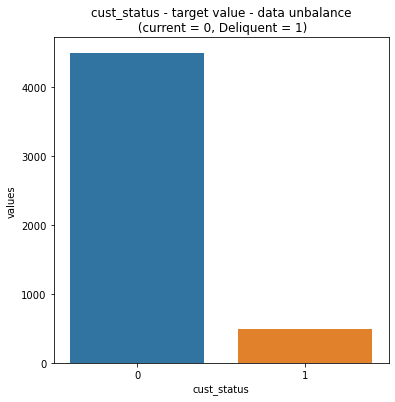

In [122]:
# To check the distribution of the target variable
temp = merge_data_drop2["cust_status"].value_counts()
df = pd.DataFrame({'cust_status': temp.index,'values': temp.values})
plt.figure(figsize = (6,6))
plt.title('cust_status - target value - data unbalance\n (current = 0, Deliquent = 1)')
sns.set_color_codes("pastel")
sns.barplot(x = 'cust_status', y="values", data=df)
locs, labels = plt.xticks()
plt.show()

In [123]:
print(temp)

0    4488
1     503
Name: cust_status, dtype: int64


In [124]:
# data is considered to be unbalanced with respect the target value cust_status

In [125]:
#Modelling
from sklearn.model_selection import train_test_split
x=merge_data_drop2.drop(['Account_Number','cust_status'], axis=1)
y=merge_data_drop2['cust_status']
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2, random_state=1)

In [126]:
# logistic regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, classification_report, accuracy_score, confusion_matrix
#x_test= data_drop2_final.loc[(data_drop2_final['Month'] >= '7/01/2017') & (data_drop2_final['Month'] < '8/01/2017')]
log_reg = LogisticRegression()
log_reg.fit(x_train,y_train)
pred = log_reg.predict(x_test)
print('Accuracy: ',accuracy_score(y_test, pred))
print('AUC_score: ',roc_auc_score(y_test, pred))
print('Classification report: \n ',classification_report(y_test, pred))
confusion_matrix(y_test,pred)

Accuracy:  0.8978978978978979
AUC_score:  0.5038369093034025
Classification report: 
                precision    recall  f1-score   support

           0       0.90      1.00      0.95       898
           1       0.33      0.01      0.02       101

    accuracy                           0.90       999
   macro avg       0.62      0.50      0.48       999
weighted avg       0.84      0.90      0.85       999



array([[896,   2],
       [100,   1]], dtype=int64)

In [127]:
# Accuracy is 89%, AUC score is 50% which is not a good sign which means there is complete randomness in
# predicting the output. predict default takes 0.5 threshold. Let us try with different thresholds as below.
# Since data is unbalanced, auc score is better metric to look at than accuracy

In [128]:
# Lets try to balance the data with respect to target value using SMOTE method and see how the results will change 
# SMOTE -Synthetic Minority oversampling technique is used to balance the imbalanced dataset
from imblearn.over_sampling import SMOTE
smote = SMOTE()

In [129]:
x_train_smote, y_train_smote = smote.fit_resample(x_train,y_train)

In [130]:
# count of target class before and after applying SMOTE
from collections import Counter
print('Before SMOTE: ', Counter(y_train))
print('After SMOTE: ', Counter(y_train_smote))

Before SMOTE:  Counter({0: 3590, 1: 402})
After SMOTE:  Counter({0: 3590, 1: 3590})


In [131]:
# Checking the metrics after applying SMOTE
log_reg = LogisticRegression()
log_reg.fit(x_train_smote,y_train_smote)
pred = log_reg.predict(x_test)
print('Accuracy: ',accuracy_score(y_test, pred))
print('AUC_score: ',roc_auc_score(y_test, pred))
print('Classification report: \n ',classification_report(y_test, pred))
confusion_matrix(y_test,pred)

Accuracy:  0.7937937937937938
AUC_score:  0.5557730049174183
Classification report: 
                precision    recall  f1-score   support

           0       0.91      0.85      0.88       898
           1       0.17      0.26      0.20       101

    accuracy                           0.79       999
   macro avg       0.54      0.56      0.54       999
weighted avg       0.84      0.79      0.81       999



array([[767, 131],
       [ 75,  26]], dtype=int64)

In [132]:
# Hyper parameter tuning for logistic regression
from sklearn.model_selection import GridSearchCV
params = {'penalty':['l1','l2'],
         'tol':[0.0001,0.001,0.1],
         'C':[0.1,0.3,0.6,1]}

grid = GridSearchCV(estimator=LogisticRegression(solver='liblinear'),param_grid=params,cv=5,scoring='roc_auc')
grid.fit(x_train_smote,y_train_smote)
print(grid.best_score_)
print(grid.best_estimator_)

0.9855417012593012
LogisticRegression(C=0.1, penalty='l1', solver='liblinear', tol=0.001)


In [133]:
# finding the metrics again based on the best combination of parameters
best_lr = grid.best_estimator_
pred = best_lr.predict(x_test)
print('Accuracy: ',accuracy_score(y_test, pred))
print('AUC_score: ',roc_auc_score(y_test, pred))
print('Classification report: \n ',classification_report(y_test, pred))
confusion_matrix(y_test,pred)

Accuracy:  0.9569569569569569
AUC_score:  0.870609054223908
Classification report: 
                precision    recall  f1-score   support

           0       0.97      0.98      0.98       898
           1       0.80      0.76      0.78       101

    accuracy                           0.96       999
   macro avg       0.89      0.87      0.88       999
weighted avg       0.96      0.96      0.96       999



array([[879,  19],
       [ 24,  77]], dtype=int64)

In [197]:
X_test_july_current=pd.read_excel(r"C:\Users\Geetha\Desktop\Casestudy\july_current_test.xlsx")
output_july_current=best_lr.predict(X_test_july_current)

In [198]:
np.set_printoptions(threshold=np.inf)
output_july_current

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [188]:
series_status=pd.Series(output_july_current)

In [189]:
df_july_current_status=pd.DataFrame(series_status)
df_july_current_status

,0
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


In [190]:
#saving the  python file in excel
datatoexcel = pd.ExcelWriter('July_cur_del_status.xlsx', engine='xlsxwriter')
df_july_current_status.to_excel(datatoexcel, sheet_name='Sheet1')
datatoexcel.save()

In [179]:
test_prob_july=best_lr.predict_proba(X_test_july_current)[:,1]
np.set_printoptions(threshold=np.inf) 
test_prob_july

array([0.07082936, 0.04900326, 0.09122019, 0.1079015 , 0.08825812,
       0.10615537, 0.22026314, 0.10306491, 0.17403685, 0.10981794,
       0.0973485 , 0.05173614, 0.09452716, 0.02944169, 0.10375979,
       0.13071292, 0.03992349, 0.03991944, 0.10635065, 0.07809649,
       0.0934563 , 0.12265186, 0.07915772, 0.08874053, 0.08846242,
       0.10500357, 0.10330207, 0.10289329, 0.03934705, 0.07708597,
       0.05352186, 0.04876591, 0.1101123 , 0.10634711, 0.09980671,
       0.10973369, 0.10498277, 0.12320096, 0.09412824, 0.09147171,
       0.09015773, 0.11134124, 0.13286147, 0.04418657, 0.07499295,
       0.05759264, 0.07337431, 0.16736211, 0.06970493, 0.09378035,
       0.10834749, 0.05364105, 0.0863495 , 0.05142289, 0.08947776,
       0.0982166 , 0.10230429, 0.120471  , 0.06635965, 0.08095191,
       0.10012219, 0.05220184, 0.04030989, 0.93538202, 0.08191764,
       0.07762685, 0.05975805, 0.1075247 , 0.07300299, 0.10999238,
       0.08456314, 0.05234419, 0.03075771, 0.17336334, 0.08715

In [180]:
series=pd.Series(test_prob_july)

In [182]:
df_july_current=pd.DataFrame(series)
df_july_current

,0
0,0.070829
1,0.049003
2,0.091220
3,0.107901
4,0.088258
5,0.106155
6,0.220263
7,0.103065
8,0.174037
9,0.109818


In [187]:
#saving the  python file in excel
datatoexcel = pd.ExcelWriter('July_del_prob.xlsx', engine='xlsxwriter')
df_july_current.to_excel(datatoexcel, sheet_name='Sheet1')
datatoexcel.save()

In [200]:
# With hyper parameter tuning parameters we were able to increace the AUC_score to 87% and accuracy to 95%. Let us see how
# decision tree algorithm will perform

In [201]:
# Feature importance
x_train.columns

Index(['FICO_Score_Original', 'FICO_Score_Current', 'Commitments',
       'Outstandings', 'LTV_Original', 'LTV_Current', 'Day_Past_Due',
       'Origination_DTI', 'APR', 'Borrower.Zip_Code',
       'Interest_Variability_Code_FXD', 'Interest_Variability_Code_VAR',
       'Lien_Position_JR_LIEN', 'Lien_Position_SR_LIEN'],
      dtype='object')

In [202]:
dict(zip(x_train.columns,sorted(log_reg.coef_[0])))

{'FICO_Score_Original': -2.457019693194761e-05,
 'FICO_Score_Current': -7.280245063134967e-07,
 'Commitments': -1.4873676522077438e-07,
 'Outstandings': -8.654468733747219e-10,
 'LTV_Original': -4.859772851134931e-10,
 'LTV_Current': -1.702585134701015e-10,
 'Day_Past_Due': 6.886071962839804e-11,
 'Origination_DTI': 1.6076794761289939e-10,
 'APR': 2.289775363656609e-10,
 'Borrower.Zip_Code': 2.53192325917264e-10,
 'Interest_Variability_Code_FXD': 4.1178424701141993e-10,
 'Interest_Variability_Code_VAR': 9.253637754045432e-09,
 'Lien_Position_JR_LIEN': 4.060841738343166e-07,
 'Lien_Position_SR_LIEN': 2.0891125933756936e-05}

<AxesSubplot:>

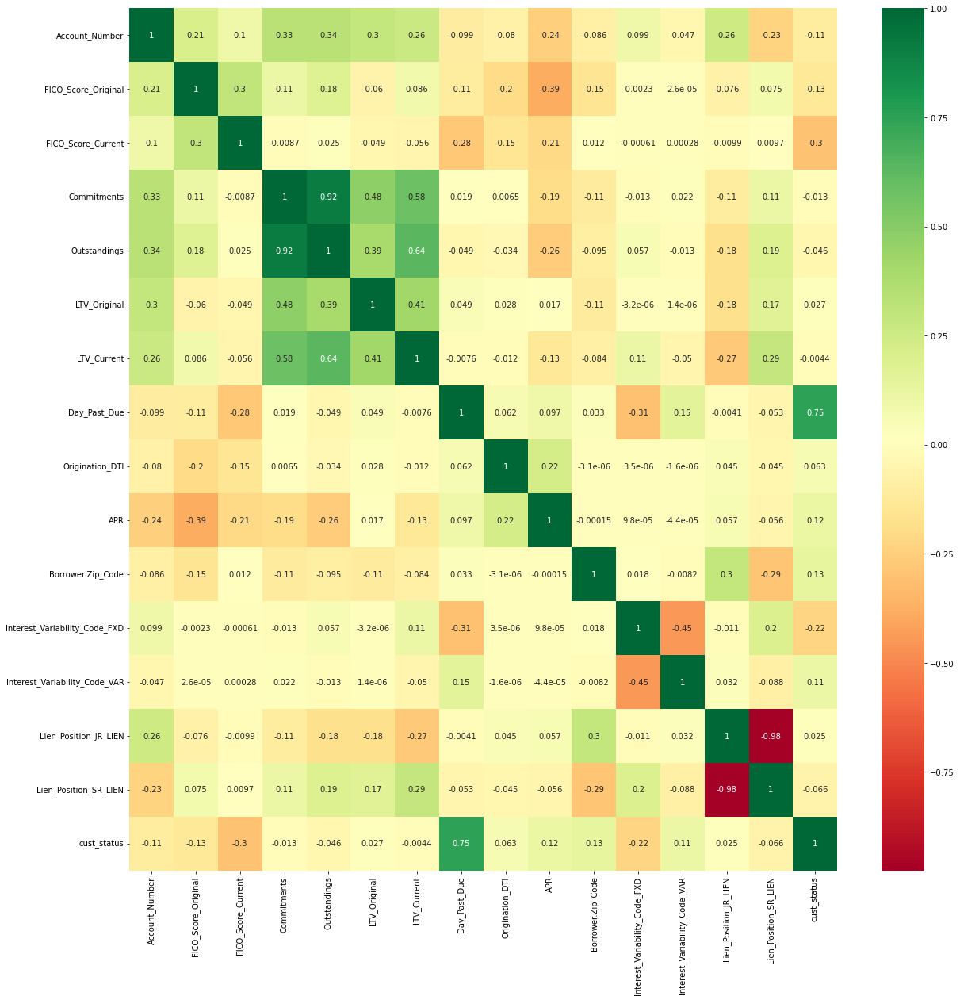

In [203]:
import seaborn as sns
corrmat=merge_data_drop2.corr()
top_corr_features=corrmat.index
plt.figure(figsize=(20,20))
sns.heatmap(merge_data_drop2[top_corr_features].corr(), annot=True, cmap='RdYlGn')

In [204]:
#Top features influencing output are 
#Day_Past_Due, APR, zipcode, Var_interest_variability_code, Origination_DTI, LTV_original and JR_lien_position

In [205]:
# Modelling using decision Tree algorithm
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier(class_weight='balanced',random_state=1)
dtc.fit(x_train,y_train)

DecisionTreeClassifier(class_weight='balanced', random_state=1)

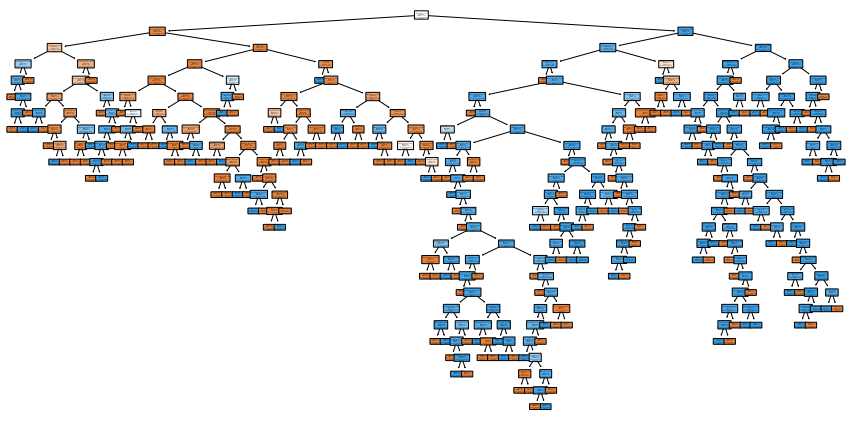

In [206]:
#training data decision tree
from sklearn import tree
plt.figure(figsize=(15,7.5))
tree.plot_tree(dtc, filled = True, rounded = True, class_names = ['0','1'], feature_names = x.columns);

In [207]:
pred_dec = dtc.predict(x_test)
print('Accuracy: ',accuracy_score(y_test, pred_dec))
print('AUC_score: ',roc_auc_score(y_test, pred_dec))
print('Classification report: \n ',classification_report(y_test, pred_dec))
confusion_matrix(y_test,pred_dec)

Accuracy:  0.944944944944945
AUC_score:  0.8287779223356635
Classification report: 
                precision    recall  f1-score   support

           0       0.96      0.97      0.97       898
           1       0.75      0.68      0.72       101

    accuracy                           0.94       999
   macro avg       0.86      0.83      0.84       999
weighted avg       0.94      0.94      0.94       999



array([[875,  23],
       [ 32,  69]], dtype=int64)

In [208]:
# using decision trees, got accuracy of 94% and auc_score of 82%. However, there is high chance that model gets overfited 
# with decision trees, lets explore to see if performance can be improved with cost complexity pruning

In [209]:
# performing cost complexity pruning to decide max depth to avoid overfitting of the model and improve accuracy of test data.
# One way to find the optimal value of alpha is to plot accuracy of tree as a function of different values for both train and test data

path=dtc.cost_complexity_pruning_path(x_train,y_train)        #determine alpha valus
ccp_alphas = path.ccp_alphas    # extract different values for alpha
ccp_alphas = ccp_alphas[:-1]    # exclude maximum value for alpha as this would prune all leaves

dtcs=[]   # array to put decision trees into
# create decision tree for each alpha value and store in aray
for ccp_alpha in ccp_alphas:
    dtc=DecisionTreeClassifier(random_state=1,ccp_alpha=ccp_alpha,class_weight='balanced')
    dtc.fit(x_train, y_train)
    dtcs.append(dtc)

In [210]:
dtcs

[DecisionTreeClassifier(class_weight='balanced', random_state=1),
 DecisionTreeClassifier(ccp_alpha=1.3916444598365634e-19,
                        class_weight='balanced', random_state=1),
 DecisionTreeClassifier(ccp_alpha=1.8555259464487512e-19,
                        class_weight='balanced', random_state=1),
 DecisionTreeClassifier(ccp_alpha=1.8555259464487512e-19,
                        class_weight='balanced', random_state=1),
 DecisionTreeClassifier(ccp_alpha=4.638814866121878e-19, class_weight='balanced',
                        random_state=1),
 DecisionTreeClassifier(ccp_alpha=6.030459325958441e-19, class_weight='balanced',
                        random_state=1),
 DecisionTreeClassifier(ccp_alpha=6.49434081257063e-19, class_weight='balanced',
                        random_state=1),
 DecisionTreeClassifier(ccp_alpha=8.349866759019379e-19, class_weight='balanced',
                        random_state=1),
 DecisionTreeClassifier(ccp_alpha=8.349866759019379e-19, class_weight='

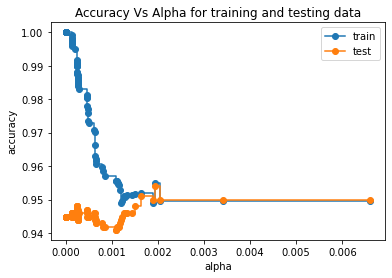

In [211]:
# plot the accuracy of training and testing data as a function of alpha
train_scores=[dtc.score(x_train,y_train) for dtc in dtcs]
test_scores = [dtc.score(x_test,y_test) for dtc in dtcs]

fig, ax= plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('Accuracy Vs Alpha for training and testing data')
ax.plot(ccp_alphas, train_scores, marker='o', label='train', drawstyle='steps-post')
ax.plot(ccp_alphas, test_scores, marker='o', label='test', drawstyle='steps-post')
ax.legend()
plt.show()

In [212]:
# we observe that accuracy of test data reaches maximum of 95% when alpha = 0.0017. To be sure that this is optimal alpha value
# we use method called k fold cross validation.

<AxesSubplot:xlabel='tree'>

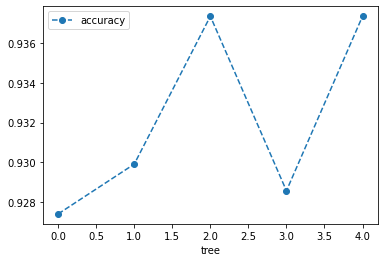

In [213]:
from sklearn.model_selection import cross_val_score
dtc=DecisionTreeClassifier(random_state=1,ccp_alpha=0.0017,class_weight='balanced') # tree with ccp_alpha =0.006
# 5 fold cross validation
scores = cross_val_score(dtc, x_train, y_train, cv=5)
dec_tree=pd.DataFrame(data={'tree': range(5), 'accuracy': scores})
dec_tree.plot(x='tree', y='accuracy', marker='o', linestyle='--')

In [214]:
#Above graph shows that alpha is sensitive to different data sets. Using cross validation lets find optimal alpha value

<AxesSubplot:xlabel='alpha'>

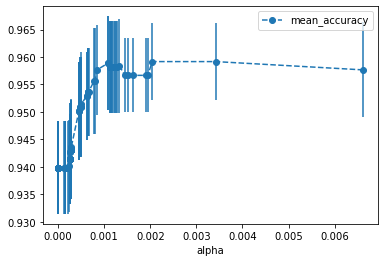

In [215]:
# array to store results of each fold during cross validation
alpha_val_values=[]
for ccp_alpha in ccp_alphas:
    dtc=DecisionTreeClassifier(random_state=0,ccp_alpha=ccp_alpha)
    scores=cross_val_score(dtc, x_train,y_train, cv=5)
    alpha_val_values.append([ccp_alpha, np.mean(scores), np.std((scores))])
#ploting graphs
alpha_results=pd.DataFrame(alpha_val_values, columns=['alpha','mean_accuracy', 'std'])
alpha_results.plot(x='alpha',y='mean_accuracy',yerr='std', marker='o',linestyle='--')

In [216]:
# using optimal value of alpha
dtc_pruned=DecisionTreeClassifier(random_state=0,class_weight='balanced',ccp_alpha=0.002)
dtc_pruned.fit(x_train,y_train)
pred_dt = dtc_pruned.predict(x_test)
print('Accuracy: ',accuracy_score(y_test, pred_dt))
print('ROC_AUC: ',roc_auc_score(y_test, pred_dt))
print('Classification report: \n ',classification_report(y_test, pred_dt))
confusion_matrix(y_test,pred_dt)

Accuracy:  0.953953953953954
ROC_AUC:  0.9260568038986526
Classification report: 
                precision    recall  f1-score   support

           0       0.99      0.96      0.97       898
           1       0.72      0.89      0.80       101

    accuracy                           0.95       999
   macro avg       0.85      0.93      0.89       999
weighted avg       0.96      0.95      0.96       999



array([[863,  35],
       [ 11,  90]], dtype=int64)

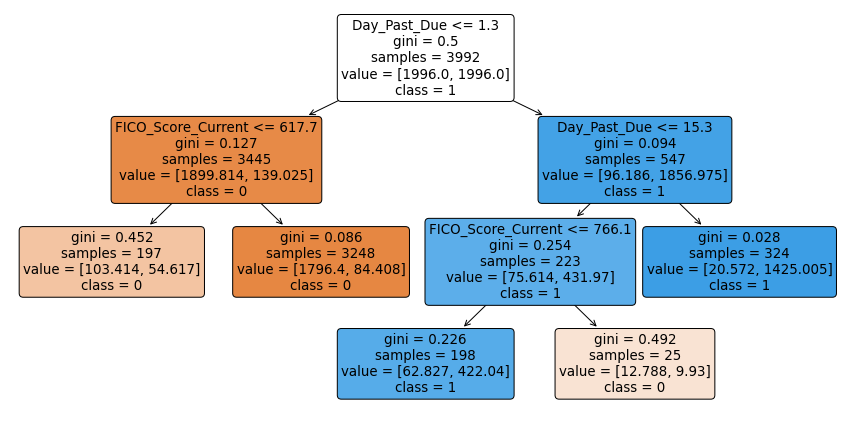

In [217]:
#pruned tree
plt.figure(figsize=(15,7.5))
tree.plot_tree(dtc_pruned, filled=True, rounded=True, class_names=['0','1'], feature_names=x.columns);